In [1]:
from __future__ import print_function
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import mlrose_hiive as mlrose
from mlrose_hiive.decorators import short_name
from mlrose_hiive.runners._runner_base import _RunnerBase
import time


%matplotlib inline

# Algorithms

In [2]:
def my_callback(**kwargs):
    print(f"Current Iteration: {kwargs['iteration']}")
    return True

### Random Restart Hill Climbing

In [91]:
def rrhc(problem, seed, restarts, max_iters):
    best_state, best_fitness, data = mlrose.random_hill_climb(problem=problem, max_attempts=5000, max_iters=max_iters, 
                                                        restarts=restarts, init_state=None, curve=True, 
                                                        random_state=seed, state_fitness_callback=my_callback,
                                                        callback_user_info=[])
    
    return best_state, best_fitness, data

### Simulated Annealing

In [112]:
def sa(problem, schedule, seed, max_iters):
    best_state, best_fitness, data = mlrose.simulated_annealing(problem=problem, schedule=schedule, 
                                                      max_attempts = 10, max_iters = max_iters,
                                                      random_state = seed, curve = True, 
                                                      state_fitness_callback=my_callback, callback_user_info=[])
    
    return best_state, best_fitness, data

### Genetic Algorithm

In [5]:
def ga(problem, seed, pop_size, mutation, max_iters):
    best_state, best_fitness, data = mlrose.genetic_alg(problem=problem, pop_size=pop_size, mutation_prob=mutation, 
                                                    max_attempts=10, max_iters=max_iters, curve=True, random_state=seed,
                                                    state_fitness_callback=my_callback, callback_user_info=[])
    
    return best_state, best_fitness, data

### MIMIC

In [6]:
def mimic(problem, seed, pop_size, max_iters, keep_pct):
    best_state, best_fitness, data = mlrose.mimic(problem=problem, pop_size=pop_size, keep_pct=keep_pct, max_attempts=10, 
                                            max_iters=max_iters, curve=True, random_state=seed, 
                                            state_fitness_callback=my_callback, callback_user_info=[])
    
    return best_state, best_fitness, data

# Four Peaks Problem

In [43]:
fitness = mlrose.FourPeaks(t_pct=0.1)
state = np.array([1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0])
fitness.evaluate(state)

16

In [83]:
fitness = mlrose.FourPeaks(t_pct=0.1)
problem = mlrose.DiscreteOpt(length=50, fitness_fn=fitness, maximize=True, max_val=2)

# Random Restart Hill Climbing

#### Untuned

In [84]:
seeds = np.random.randint(1, 50, 10)

fitness_values = []

fin_data = []
i=0
total_start_time = time.time()
for seed in seeds:
    print("=======================================\n")
    print("Seed number: ", i)
    
    start_time = time.time()
    best_state, best_fitness, data = rrhc(problem, seed=seed, restarts=0, max_iters=1000)
    end_time = time.time()
    
    fitness_values.append(best_fitness)
    fin_data.append(data)
    
    print("Best State: ", best_state)
    print("Best Fitness: ", best_fitness)
    print("Iterations: ", len(data))
    print("Time Taken: ", end_time - start_time)
    print("\n=======================================")
    i+=1

total_end_time = time.time()


Seed number:  0
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Best State:  [1 1 1 1 1 0 0 1 1 1 0 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 0 0 1 1 0 1 0 0 0 0 1
 1 0 0 1 1 0 0 1 1 0 1 1 1]
Best Fitness:  5.0
Iterations:  10
Time Taken:  0.02632308006286621


Seed number:  1
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Best State:  [0 0 1 0 0 0 0 1 1 0 1 1 1 0 1 1 0 0 0 0 1 0 0 0 1 1 1 1 1 0 0 0 0 0 1 0 0
 1 1 0 1 0 1 1 0 1 1 1 0 1]
Best Fitness:  0.0
Iterations:  10
Time Taken:  0.005248069763183594


Seed number:  2
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current I

Average Fitness Value:  2.0
Total Time Taken:  0.08711814880371094


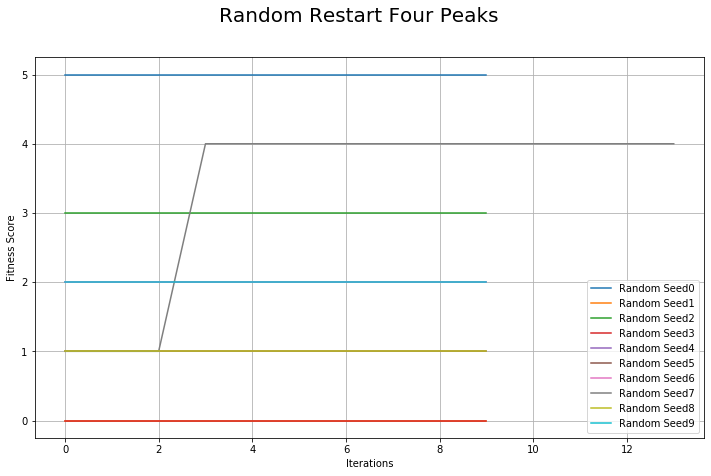

In [85]:
i=0
plt.figure(figsize=(12, 7))
plt.suptitle('Random Restart Four Peaks', fontsize=20)
plt.xlabel('Iterations')
plt.ylabel('Fitness Score')
plt.grid()
for data in fin_data:
    label = "Random Seed" + str(i)
    plt.plot(data, label=label)
    i += 1
plt.legend(loc='best')

print("Average Fitness Value: ", sum(fitness_values)/len(fitness_values))
print("Total Time Taken: ", total_end_time - total_start_time)

plt.savefig('RHC.png')

### Tuning Process

In [88]:
experiment_name = 'RRHC Tuning'

rhc = mlrose.RHCRunner(problem=problem,
                    experiment_name=experiment_name,
                    seed=0,
                    iteration_list=2 ** np.arange(10),
                    max_attempts=5000,
                    restart_list=[25, 75, 100])   
df_run_stats, df_run_curves = rhc.run()

the_index = np.argmax(df_run_stats["Fitness"])
df_run_stats.iloc[the_index]

Running rhc
*****************
*** Run START ***
*****************
restarts:[25], max_iters:[512], current_restart:[0]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[0.00], fitness:[0.0000]
	[0 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 0// 1 1 0 0 1 0 1 1 1 1 1 0 1]...

restarts:[25], max_iters:[512], current_restart:[0]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], done:[False], time:[0.00], fitness:[0.0000]
	[0 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 0// 1 1 0 0 1 0 1 1 1 1 1 0 1]...

restarts:[25], max_iters:[512], current_restart:[0]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[0.03], fitness:[0.0000]
	[0 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 0// 1 1 0 0 1 0 1 1 1 1 1 0 1]...

restarts:[25], max_iters:[512], current_restart:[0]
runner_name:[rhc], experiment_nam

restarts:[25], max_iters:[512], current_restart:[2]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[207], iteration:[256], done:[False], time:[0.55], fitness:[5.0000]
	[1 1 1 1 1 0 0 0 1 1 0 1 1 0 1 0 0 1 0 1 1 1 1 0 1 1 1 0 0 1 1 1 1 1 0 1 0// 0 1 0 1 0 0 1 0 1 1 1 1 1]...

restarts:[25], max_iters:[512], current_restart:[2]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[42], iteration:[512], done:[True], time:[0.68], fitness:[10.0000]
	[1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 0 1 0 1 1 1 1 0 1 1 1 0 0 1 1 1 1 1 0 1 0// 0 1 0 1 0 0 1 0 1 1 1 1 1]...

restarts:[25], max_iters:[512], current_restart:[3]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[0.69], fitness:[4.0000]
	[1 1 1 1 0 0 1 1 0 0 0 1 1 1 0 0 0 1 1 0 0 1 1 1 0 0 1 0 1 0 0 0 1 0 1 0 1// 1 1 1 1 0 0 1 1 1 0 1 0 1]...

restarts:[25], max_iters:[512], current_restart:[3]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], done:[False], 

restarts:[25], max_iters:[512], current_restart:[5]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[39], iteration:[256], done:[False], time:[1.87], fitness:[6.0000]
	[0 0 0 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 1 0 0 0 1 1 1 1 0 1 1 0 1 0 1 0 0 0 0// 0 0 1 0 0 1 1 0 0 0 0 0 0]...

restarts:[25], max_iters:[512], current_restart:[5]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[8], iteration:[512], done:[True], time:[2.03], fitness:[32.0000]
	[0 0 0 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[25], max_iters:[512], current_restart:[6]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[2.05], fitness:[1.0000]
	[1 0 0 1 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 1 1 1 0 1 1 1 1 1 1 0 0 0 1 0 1 1 0// 0 1 1 1 0 1 1 1 1 1 1 0 1]...

restarts:[25], max_iters:[512], current_restart:[6]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], done:[False], ti

restarts:[25], max_iters:[512], current_restart:[8]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[18], iteration:[32], done:[False], time:[4.53], fitness:[2.0000]
	[0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 0 0 1 0 0 0 1 0 0 0 1 0 1 1 0 1 1// 1 0 1 0 1 1 0 1 1 0 1 0 0]...

restarts:[25], max_iters:[512], current_restart:[8]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[8], iteration:[64], done:[False], time:[4.60], fitness:[4.0000]
	[0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 0 0 1 0 0 0 1 0 0 0 1 0 1 1 0 1 1// 1 0 1 0 1 1 0 1 1 0 0 0 0]...

restarts:[25], max_iters:[512], current_restart:[8]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[44], iteration:[128], done:[False], time:[4.69], fitness:[5.0000]
	[0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 0 0 1 0 0 0 1 0 0 0 1 0 1 1 0 1 1// 1 0 1 0 1 1 0 1 0 0 0 0 0]...

restarts:[25], max_iters:[512], current_restart:[8]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[49], iteration:[256], done:[False]

restarts:[25], max_iters:[512], current_restart:[11]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[8], iteration:[64], done:[False], time:[7.66], fitness:[5.0000]
	[1 1 1 1 1 0 1 1 1 0 0 1 1 0 1 1 0 0 0 1 0 1 1 1 1 0 1 1 0 1 0 0 0 0 1 1 0// 1 1 0 0 1 1 1 0 0 1 1 1 0]...

restarts:[25], max_iters:[512], current_restart:[11]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[31], iteration:[128], done:[False], time:[7.77], fitness:[9.0000]
	[1 1 1 1 1 1 1 1 1 0 0 1 1 0 1 1 0 0 0 1 0 1 1 1 1 0 1 1 0 1 0 0 0 0 1 1 0// 1 1 0 0 1 1 1 0 0 1 1 1 0]...

restarts:[25], max_iters:[512], current_restart:[11]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[78], iteration:[256], done:[False], time:[7.95], fitness:[10.0000]
	[1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 0 0 0 1 0 1 1 1 1 0 1 1 0 1 0 0 0 0 1 1 0// 1 1 0 0 1 1 1 0 0 1 1 1 0]...

restarts:[25], max_iters:[512], current_restart:[11]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[1], iteration:[512], done:[T

restarts:[25], max_iters:[512], current_restart:[14]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[7], iteration:[32], done:[False], time:[13.72], fitness:[5.0000]
	[1 1 1 1 1 0 1 1 0 1 1 0 0 1 0 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 1 0 1 0 1 0 0// 1 0 0 1 1 0 1 0 1 1 1 0 1]...

restarts:[25], max_iters:[512], current_restart:[14]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[39], iteration:[64], done:[False], time:[13.81], fitness:[5.0000]
	[1 1 1 1 1 0 1 1 0 1 1 0 0 1 0 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 1 0 1 0 1 0 0// 1 0 0 1 1 0 1 0 1 1 1 0 1]...

restarts:[25], max_iters:[512], current_restart:[14]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[7], iteration:[128], done:[False], time:[13.93], fitness:[8.0000]
	[1 1 1 1 1 1 1 1 0 1 1 0 0 1 0 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 1 0 1 0 1 0 0// 1 0 0 1 1 0 1 0 1 1 1 0 1]...

restarts:[25], max_iters:[512], current_restart:[14]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[26], iteration:[256], done:[

restarts:[25], max_iters:[512], current_restart:[17]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[10], iteration:[16], done:[False], time:[17.27], fitness:[2.0000]
	[1 1 0 1 0 1 0 0 0 0 1 0 0 1 1 0 0 0 1 1 1 0 1 0 1 1 0 1 0 1 1 0 1 1 0 0 1// 0 1 0 1 1 1 1 0 1 1 0 1 1]...

restarts:[25], max_iters:[512], current_restart:[17]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[26], iteration:[32], done:[False], time:[17.32], fitness:[2.0000]
	[1 1 0 1 0 1 0 0 0 0 1 0 0 1 1 0 0 0 1 1 1 0 1 0 1 1 0 1 0 1 1 0 1 1 0 0 1// 0 1 0 1 1 1 1 0 1 1 0 1 1]...

restarts:[25], max_iters:[512], current_restart:[17]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[8], iteration:[64], done:[False], time:[17.40], fitness:[4.0000]
	[1 1 1 1 0 1 0 0 0 0 1 0 0 1 1 0 0 0 1 1 1 0 1 0 1 1 0 1 0 1 1 0 1 1 0 0 1// 0 1 0 1 1 1 1 0 1 1 0 1 1]...

restarts:[25], max_iters:[512], current_restart:[17]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[12], iteration:[128], done:[

restarts:[25], max_iters:[512], current_restart:[20]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[8], done:[False], time:[21.11], fitness:[5.0000]
	[0 1 1 0 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 0 0 0 0 0 1 1 1 0 0 1 1 1 1 1 1 1 1// 0 1 0 0 1 1 1 1 0 0 0 0 0]...

restarts:[25], max_iters:[512], current_restart:[20]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[10], iteration:[16], done:[False], time:[21.17], fitness:[5.0000]
	[0 1 1 0 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 0 0 0 0 0 1 1 1 0 0 1 1 1 1 1 1 1 1// 0 1 0 0 1 1 1 1 0 0 0 0 0]...

restarts:[25], max_iters:[512], current_restart:[20]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[26], iteration:[32], done:[False], time:[21.24], fitness:[5.0000]
	[0 1 1 0 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 0 0 0 0 0 1 1 1 0 0 1 1 1 1 1 1 1 1// 0 1 0 0 1 1 1 1 0 0 0 0 0]...

restarts:[25], max_iters:[512], current_restart:[20]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[7], iteration:[64], done:[Fal

restarts:[25], max_iters:[512], current_restart:[23]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[1], iteration:[8], done:[False], time:[25.68], fitness:[1.0000]
	[0 1 0 1 1 1 1 0 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 1 0// 1 1 1 1 0 1 1 1 0 1 1 1 0]...

restarts:[25], max_iters:[512], current_restart:[23]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[16], done:[False], time:[25.74], fitness:[1.0000]
	[0 1 0 1 1 1 1 0 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 1 0// 1 1 1 1 0 1 1 1 0 1 1 1 0]...

restarts:[25], max_iters:[512], current_restart:[23]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[25], iteration:[32], done:[False], time:[25.83], fitness:[1.0000]
	[0 1 0 1 1 1 1 0 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 1 0// 1 1 1 1 0 1 1 1 0 1 1 1 0]...

restarts:[25], max_iters:[512], current_restart:[23]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[57], iteration:[64], done:[Fal

restarts:[75], max_iters:[512], current_restart:[0]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[0.16], fitness:[0.0000]
	[0 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 0// 1 1 0 0 1 0 1 1 1 1 1 0 1]...

restarts:[75], max_iters:[512], current_restart:[0]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[16], done:[False], time:[0.23], fitness:[3.0000]
	[1 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 0// 1 1 0 0 1 0 1 1 1 1 1 0 1]...

restarts:[75], max_iters:[512], current_restart:[0]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[21], iteration:[32], done:[False], time:[0.29], fitness:[3.0000]
	[1 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 0// 1 1 0 0 1 0 1 1 1 1 1 0 1]...

restarts:[75], max_iters:[512], current_restart:[0]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[20], iteration:[64], done:[False], ti

restarts:[75], max_iters:[512], current_restart:[3]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[2.38], fitness:[4.0000]
	[1 1 1 1 0 0 1 1 0 0 0 1 1 1 0 0 0 1 1 0 0 1 1 1 0 0 1 0 1 0 0 0 1 0 1 0 1// 1 1 1 1 0 0 1 1 1 0 1 0 1]...

restarts:[75], max_iters:[512], current_restart:[3]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[6], iteration:[16], done:[False], time:[2.46], fitness:[5.0000]
	[1 1 1 1 1 0 1 1 0 0 0 1 1 1 0 0 0 1 1 0 0 1 1 1 0 0 1 0 1 0 0 0 1 0 1 0 1// 1 1 1 1 0 0 1 1 1 0 1 0 1]...

restarts:[75], max_iters:[512], current_restart:[3]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[22], iteration:[32], done:[False], time:[2.53], fitness:[5.0000]
	[1 1 1 1 1 0 1 1 0 0 0 1 1 1 0 0 0 1 1 0 0 1 1 1 0 0 1 0 1 0 0 0 1 0 1 0 1// 1 1 1 1 0 0 1 1 1 0 1 0 1]...

restarts:[75], max_iters:[512], current_restart:[3]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[54], iteration:[64], done:[False], ti

restarts:[75], max_iters:[512], current_restart:[6]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[4.95], fitness:[1.0000]
	[1 0 0 1 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 1 1 1 0 1 1 1 1 1 1 0 0 0 1 0 1 1 0// 0 1 1 1 0 1 1 1 1 1 1 0 1]...

restarts:[75], max_iters:[512], current_restart:[6]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], done:[False], time:[4.95], fitness:[1.0000]
	[1 0 0 1 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 1 1 1 0 1 1 1 1 1 1 0 0 0 1 0 1 1 0// 0 1 1 1 0 1 1 1 1 1 1 0 1]...

restarts:[75], max_iters:[512], current_restart:[6]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[5.01], fitness:[1.0000]
	[1 0 0 1 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 1 1 1 0 1 1 1 1 1 1 0 0 0 1 0 1 1 0// 0 1 1 1 0 1 1 1 1 1 1 0 1]...

restarts:[75], max_iters:[512], current_restart:[6]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[5

restarts:[75], max_iters:[512], current_restart:[8]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[8], iteration:[64], done:[False], time:[7.51], fitness:[4.0000]
	[0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 0 0 1 0 0 0 1 0 0 0 1 0 1 1 0 1 1// 1 0 1 0 1 1 0 1 1 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[8]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[44], iteration:[128], done:[False], time:[7.63], fitness:[5.0000]
	[0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 0 0 1 0 0 0 1 0 0 0 1 0 1 1 0 1 1// 1 0 1 0 1 1 0 1 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[8]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[49], iteration:[256], done:[False], time:[7.80], fitness:[7.0000]
	[0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 0 0 1 0 0 0 1 0 0 0 1 0 1 1 0 1 1// 1 0 1 0 1 1 0 0 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[8]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[95], iteration:[512], done:[True]

restarts:[75], max_iters:[512], current_restart:[11]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[10.86], fitness:[3.0000]
	[1 1 1 0 1 0 1 1 1 0 0 1 1 0 1 1 0 0 0 1 0 1 1 1 1 0 1 1 0 1 0 0 0 0 1 1 0// 1 1 0 0 1 1 1 0 0 1 1 1 0]...

restarts:[75], max_iters:[512], current_restart:[11]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[10.95], fitness:[3.0000]
	[1 1 1 0 1 0 1 1 1 0 0 1 1 0 1 1 0 0 0 1 0 1 1 1 1 0 1 1 0 1 0 0 0 0 1 1 0// 1 1 0 0 1 1 1 0 0 1 1 1 0]...

restarts:[75], max_iters:[512], current_restart:[11]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:[False], time:[11.05], fitness:[3.0000]
	[1 1 1 0 1 0 1 1 1 0 0 1 1 0 1 1 0 0 0 1 0 1 1 1 1 0 1 1 0 1 0 0 0 0 1 1 0// 1 1 0 0 1 1 1 0 0 1 1 1 0]...

restarts:[75], max_iters:[512], current_restart:[11]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[33], iteration:[32], done:[Fals

restarts:[75], max_iters:[512], current_restart:[13]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[32], iteration:[512], done:[True], time:[14.97], fitness:[17.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 0 1 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1// 1 0 0 1 0 0 0 0 1 1 1 1 1]...

restarts:[75], max_iters:[512], current_restart:[14]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[15.06], fitness:[2.0000]
	[1 1 0 1 1 0 1 1 0 1 1 0 0 1 0 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 1 0 1 0 1 0 0// 1 0 0 1 1 0 1 0 1 1 1 0 1]...

restarts:[75], max_iters:[512], current_restart:[14]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], done:[False], time:[15.07], fitness:[2.0000]
	[1 1 0 1 1 0 1 1 0 1 1 0 0 1 0 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 1 0 1 0 1 0 0// 1 0 0 1 1 0 1 0 1 1 1 0 1]...

restarts:[75], max_iters:[512], current_restart:[14]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False

restarts:[75], max_iters:[512], current_restart:[16]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[24], iteration:[32], done:[False], time:[22.41], fitness:[5.0000]
	[1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1 1 1 0 0 1 0 0 1 1 0 1 0 1 1 1 0 0 1 1 0 0// 1 0 0 0 0 0 1 1 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[16]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[13], iteration:[64], done:[False], time:[22.68], fitness:[12.0000]
	[1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1 1 1 0 0 1 0 0 1 1 0 1 0 1 1 1 0 0 1 1 0 0// 1 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[16]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[41], iteration:[128], done:[False], time:[22.87], fitness:[15.0000]
	[1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1 1 1 0 0 1 0 0 1 1 0 1 0 1 1 1 0 0 1 1 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[16]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[256], don

restarts:[75], max_iters:[512], current_restart:[19]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[27.63], fitness:[3.0000]
	[1 0 1 0 1 1 0 1 1 0 1 0 0 0 0 0 1 1 0 1 0 0 0 1 1 1 0 0 0 1 1 0 1 0 0 1 0// 1 1 1 0 1 0 0 1 0 1 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[19]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[27.76], fitness:[3.0000]
	[1 0 1 0 1 1 0 1 1 0 1 0 0 0 0 0 1 1 0 1 0 0 0 1 1 1 0 0 0 1 1 0 1 0 0 1 0// 1 1 1 0 1 0 0 1 0 1 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[19]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[8], done:[False], time:[27.84], fitness:[5.0000]
	[1 0 1 0 1 1 0 1 1 0 1 0 0 0 0 0 1 1 0 1 0 0 0 1 1 1 0 0 0 1 1 0 1 0 0 1 0// 1 1 1 0 1 0 0 1 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[19]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[10], iteration:[16], done:[False]

restarts:[75], max_iters:[512], current_restart:[21]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[21], iteration:[256], done:[False], time:[32.96], fitness:[16.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 0 1 0 1 0 1 1 0 1 0 1 1 1 0 1 0 1 0// 1 0 0 1 0 1 0 1 0 1 1 1 0]...

restarts:[75], max_iters:[512], current_restart:[21]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[69], iteration:[512], done:[True], time:[33.55], fitness:[21.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 0 1 0 1 1 1 0 1 0 1 0// 1 0 0 1 0 1 0 1 0 1 1 1 0]...

restarts:[75], max_iters:[512], current_restart:[22]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[33.62], fitness:[3.0000]
	[0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 1 0 0 1 0 1 0 1 1 1 1 0 1 0 1// 0 0 1 0 1 1 1 1 0 1 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[22]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], done:[F

restarts:[75], max_iters:[512], current_restart:[24]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[7], iteration:[32], done:[False], time:[37.37], fitness:[3.0000]
	[1 1 1 0 0 0 0 0 0 0 1 0 1 1 0 0 0 1 1 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1// 1 1 0 1 1 1 1 1 1 1 1 0 1]...

restarts:[75], max_iters:[512], current_restart:[24]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[39], iteration:[64], done:[False], time:[37.51], fitness:[3.0000]
	[1 1 1 0 0 0 0 0 0 0 1 0 1 1 0 0 0 1 1 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1// 1 1 0 1 1 1 1 1 1 1 1 0 1]...

restarts:[75], max_iters:[512], current_restart:[24]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[30], iteration:[128], done:[False], time:[37.71], fitness:[4.0000]
	[1 1 1 1 0 0 0 0 0 0 1 0 1 1 0 0 0 1 1 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1// 1 1 0 1 1 1 1 1 1 1 1 0 1]...

restarts:[75], max_iters:[512], current_restart:[24]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[37], iteration:[256], done:

restarts:[75], max_iters:[512], current_restart:[27]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[42.81], fitness:[0.0000]
	[0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 1 1 1 0 1 1 1 1 0 0 1 0 1 1 0 1 1 1 1 1 0 0// 0 1 1 1 1 0 0 1 1 1 0 1 1]...

restarts:[75], max_iters:[512], current_restart:[27]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[42.90], fitness:[0.0000]
	[0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 1 1 1 0 1 1 1 1 0 0 1 0 1 1 0 1 1 1 1 1 0 0// 0 1 1 1 1 0 0 1 1 1 0 1 1]...

restarts:[75], max_iters:[512], current_restart:[27]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:[False], time:[43.00], fitness:[0.0000]
	[0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 1 1 1 0 1 1 1 1 0 0 1 0 1 1 0 1 1 1 1 1 0 0// 0 1 1 1 1 0 0 1 1 1 0 1 1]...

restarts:[75], max_iters:[512], current_restart:[27]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[1], iteration:[32], done:[False

restarts:[75], max_iters:[512], current_restart:[29]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[39], iteration:[512], done:[True], time:[48.93], fitness:[18.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 0 0 0 1 1 1 0 0 0 1 0 1 1 0 0 0// 1 1 1 1 1 0 0 0 1 0 1 0 0]...

restarts:[75], max_iters:[512], current_restart:[30]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[49.00], fitness:[2.0000]
	[0 1 0 1 1 0 0 1 0 1 0 1 0 1 0 1 0 1 0 0 1 1 0 0 1 1 1 1 1 1 1 0 0 0 0 1 0// 1 0 0 1 1 1 1 0 0 1 1 0 0]...

restarts:[75], max_iters:[512], current_restart:[30]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], done:[False], time:[49.01], fitness:[2.0000]
	[0 1 0 1 1 0 0 1 0 1 0 1 0 1 0 1 0 1 0 0 1 1 0 0 1 1 1 1 1 1 1 0 0 0 0 1 0// 1 0 0 1 1 1 1 0 0 1 1 0 0]...

restarts:[75], max_iters:[512], current_restart:[30]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False

restarts:[75], max_iters:[512], current_restart:[32]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[28], iteration:[64], done:[False], time:[54.66], fitness:[7.0000]
	[1 0 0 1 1 1 1 0 0 1 1 0 1 0 1 0 1 0 0 0 1 1 1 1 1 1 0 0 1 0 0 0 0 1 0 0 0// 1 1 1 0 1 1 0 0 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[32]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[128], done:[False], time:[54.94], fitness:[21.0000]
	[1 0 0 1 1 1 1 0 0 1 1 0 1 0 1 0 1 0 0 0 1 1 1 1 1 1 0 0 1 0 0 0 0 0 0 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[32]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[133], iteration:[256], done:[False], time:[55.40], fitness:[21.0000]
	[1 0 0 1 1 1 1 0 0 1 1 0 1 0 1 0 1 0 0 0 1 1 1 1 1 1 0 0 1 0 0 0 0 0 0 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[32]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[72], iteration:[512], d

restarts:[75], max_iters:[512], current_restart:[35]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[62.75], fitness:[2.0000]
	[1 1 0 1 1 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 1 1 0 1 1 1 0 1 1 1 1// 1 1 1 0 0 1 1 1 1 0 0 0 1]...

restarts:[75], max_iters:[512], current_restart:[35]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[63.29], fitness:[2.0000]
	[1 1 0 1 1 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 1 1 0 1 1 1 0 1 1 1 1// 1 1 1 0 0 1 1 1 1 0 0 0 1]...

restarts:[75], max_iters:[512], current_restart:[35]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[7], iteration:[16], done:[False], time:[63.80], fitness:[5.0000]
	[1 1 1 1 1 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 1 1 0 1 1 1 0 1 1 1 1// 1 1 1 0 0 1 1 1 1 0 0 0 1]...

restarts:[75], max_iters:[512], current_restart:[35]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[12], iteration:[32], done:[False

restarts:[75], max_iters:[512], current_restart:[37]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[18], iteration:[512], done:[True], time:[73.71], fitness:[23.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0 0 1 0 1 0 1 1 0 0// 0 1 1 0 1 1 0 0 1 1 1 1 1]...

restarts:[75], max_iters:[512], current_restart:[38]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[73.83], fitness:[1.0000]
	[1 0 0 1 1 1 1 0 1 0 0 1 1 1 0 0 0 0 1 1 0 0 1 0 1 1 0 0 0 0 1 1 1 0 0 1 1// 0 1 0 0 1 1 1 0 0 1 0 0 1]...

restarts:[75], max_iters:[512], current_restart:[38]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], done:[False], time:[73.83], fitness:[1.0000]
	[1 0 0 1 1 1 1 0 1 0 0 1 1 1 0 0 0 0 1 1 0 0 1 0 1 1 0 0 0 0 1 1 1 0 0 1 1// 0 1 0 0 1 1 1 0 0 1 0 0 1]...

restarts:[75], max_iters:[512], current_restart:[38]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[1], iteration:[2], done:[False

restarts:[75], max_iters:[512], current_restart:[40]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[64], done:[False], time:[80.59], fitness:[10.0000]
	[1 1 1 1 1 1 1 1 1 1 0 0 1 0 0 1 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 1 1 0 0 1 0// 1 1 1 1 1 0 1 0 0 0 1 1 0]...

restarts:[75], max_iters:[512], current_restart:[40]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[25], iteration:[128], done:[False], time:[80.93], fitness:[13.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 1 1 0 0 1 0// 1 1 1 1 1 0 1 0 0 0 1 1 0]...

restarts:[75], max_iters:[512], current_restart:[40]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[153], iteration:[256], done:[False], time:[81.55], fitness:[13.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 1 1 0 0 1 0// 1 1 1 1 1 0 1 0 0 0 1 1 0]...

restarts:[75], max_iters:[512], current_restart:[40]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[77], iteration:[512], 

restarts:[75], max_iters:[512], current_restart:[43]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:[False], time:[89.54], fitness:[0.0000]
	[0 0 1 0 0 1 0 1 1 1 0 0 0 1 0 1 1 1 1 1 1 0 1 0 0 1 1 0 0 0 1 0 0 1 1 0 1// 0 1 0 1 1 1 0 1 0 0 1 1 1]...

restarts:[75], max_iters:[512], current_restart:[43]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[4], iteration:[32], done:[False], time:[89.70], fitness:[1.0000]
	[1 0 1 0 0 1 0 1 1 1 0 0 0 1 0 1 1 1 1 1 1 0 1 0 0 1 1 0 0 0 1 0 0 1 1 0 1// 0 1 0 1 1 1 0 1 0 0 1 1 1]...

restarts:[75], max_iters:[512], current_restart:[43]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[64], done:[False], time:[89.94], fitness:[4.0000]
	[1 1 1 1 0 1 0 1 1 1 0 0 0 1 0 1 1 1 1 1 1 0 1 0 0 1 1 0 0 0 1 0 0 1 1 0 1// 0 1 0 1 1 1 0 1 0 0 1 1 1]...

restarts:[75], max_iters:[512], current_restart:[43]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[66], iteration:[128], done:[F

restarts:[75], max_iters:[512], current_restart:[46]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[104.00], fitness:[0.0000]
	[0 1 0 1 0 0 1 1 1 1 1 1 0 0 1 1 1 1 1 0 0 0 1 1 0 1 0 0 1 1 1 0 1 0 1 0 0// 1 1 0 0 0 0 1 1 1 1 1 1 1]...

restarts:[75], max_iters:[512], current_restart:[46]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[104.35], fitness:[0.0000]
	[0 1 0 1 0 0 1 1 1 1 1 1 0 0 1 1 1 1 1 0 0 0 1 1 0 1 0 0 1 1 1 0 1 0 1 0 0// 1 1 0 0 0 0 1 1 1 1 1 1 1]...

restarts:[75], max_iters:[512], current_restart:[46]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[104.55], fitness:[0.0000]
	[0 1 0 1 0 0 1 1 1 1 1 1 0 0 1 1 1 1 1 0 0 0 1 1 0 1 0 0 1 1 1 0 1 0 1 0 0// 1 1 0 0 0 0 1 1 1 1 1 1 1]...

restarts:[75], max_iters:[512], current_restart:[46]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[4], iteration:[16], done:[Fals

restarts:[75], max_iters:[512], current_restart:[48]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[256], done:[False], time:[117.02], fitness:[5.0000]
	[0 0 1 1 1 0 0 1 0 1 0 1 1 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1 1 0 0// 1 1 1 1 1 0 0 1 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[48]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[97], iteration:[512], done:[True], time:[118.38], fitness:[9.0000]
	[0 0 1 1 1 0 0 1 0 1 0 1 1 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1 1 0 0// 1 1 1 1 0 0 0 0 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[49]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[118.49], fitness:[1.0000]
	[0 1 0 1 1 0 0 0 1 0 1 1 1 1 0 1 0 1 0 0 1 0 0 0 1 1 0 0 0 0 1 1 0 1 0 1 0// 1 1 0 1 0 0 0 0 0 0 0 1 0]...

restarts:[75], max_iters:[512], current_restart:[49]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], done:[F

restarts:[75], max_iters:[512], current_restart:[51]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[33], iteration:[32], done:[False], time:[136.56], fitness:[1.0000]
	[0 1 0 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 0 0 0 0 0 1 1 1 0 0 0 1 1 1 0 0 1 0 0// 0 1 1 0 0 0 1 0 1 0 0 1 0]...

restarts:[75], max_iters:[512], current_restart:[51]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[22], iteration:[64], done:[False], time:[136.90], fitness:[4.0000]
	[1 1 1 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 0 0 0 0 0 1 1 1 0 0 0 1 1 1 0 0 1 0 0// 0 1 1 0 0 0 1 0 1 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[51]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[86], iteration:[128], done:[False], time:[137.36], fitness:[4.0000]
	[1 1 1 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 0 0 0 0 0 1 1 1 0 0 0 1 1 1 0 0 1 0 0// 0 1 1 0 0 0 1 0 1 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[51]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[8], iteration:[256], do

restarts:[75], max_iters:[512], current_restart:[54]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[147.68], fitness:[2.0000]
	[1 1 0 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 0 1 1 0 0 0 1 0 0 0 1 0 0 1 1 0 0// 0 0 0 0 0 1 0 1 1 0 1 1 0]...

restarts:[75], max_iters:[512], current_restart:[54]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[147.82], fitness:[2.0000]
	[1 1 0 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 0 1 1 0 0 0 1 0 0 0 1 0 0 1 1 0 0// 0 0 0 0 0 1 0 1 1 0 1 1 0]...

restarts:[75], max_iters:[512], current_restart:[54]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[147.96], fitness:[2.0000]
	[1 1 0 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 0 1 1 0 0 0 1 0 0 0 1 0 0 1 1 0 0// 0 0 0 0 0 1 0 1 1 0 1 1 0]...

restarts:[75], max_iters:[512], current_restart:[54]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:[Fal

restarts:[75], max_iters:[512], current_restart:[56]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[52], iteration:[256], done:[False], time:[163.61], fitness:[14.0000]
	[0 1 1 0 1 0 1 0 1 0 0 1 1 0 0 0 1 1 0 0 1 0 1 1 1 1 1 0 1 1 0 0 0 1 1 1 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[56]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[121], iteration:[512], done:[True], time:[165.35], fitness:[16.0000]
	[0 1 1 0 1 0 1 0 1 0 0 1 1 0 0 0 1 1 0 0 1 0 1 1 1 1 1 0 1 1 0 0 0 1 0 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[57]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[165.56], fitness:[3.0000]
	[1 1 1 0 1 0 0 0 1 0 1 1 0 1 1 1 0 1 1 0 1 0 1 0 0 0 1 1 0 0 0 0 0 1 0 1 1// 1 0 1 1 0 1 0 0 0 1 1 1 1]...

restarts:[75], max_iters:[512], current_restart:[57]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], don

restarts:[75], max_iters:[512], current_restart:[59]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[33], iteration:[32], done:[False], time:[182.18], fitness:[1.0000]
	[0 1 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 1 1 1 1 1 1 1 1 0 0 1 0 0 0 0// 1 1 1 0 0 1 1 1 1 1 0 1 0]...

restarts:[75], max_iters:[512], current_restart:[59]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[11], iteration:[64], done:[False], time:[182.57], fitness:[4.0000]
	[1 1 1 1 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 1 1 1 1 1 1 1 1 0 0 1 0 0 0 0// 1 1 1 0 0 1 1 1 1 1 0 1 0]...

restarts:[75], max_iters:[512], current_restart:[59]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[13], iteration:[128], done:[False], time:[183.25], fitness:[8.0000]
	[1 1 1 1 1 1 1 1 0 0 1 0 0 0 0 1 0 1 0 0 0 1 1 1 1 1 1 1 1 1 0 0 1 0 0 0 0// 1 1 1 0 0 1 1 1 1 1 0 1 0]...

restarts:[75], max_iters:[512], current_restart:[59]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[8], iteration:[256], do

restarts:[75], max_iters:[512], current_restart:[62]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[205.00], fitness:[1.0000]
	[1 0 1 0 1 1 0 1 1 1 0 1 1 1 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 1 1 1 0// 0 0 0 1 0 0 0 1 0 1 0 1 0]...

restarts:[75], max_iters:[512], current_restart:[62]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[205.14], fitness:[1.0000]
	[1 0 1 0 1 1 0 1 1 1 0 1 1 1 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 1 1 1 0// 0 0 0 1 0 0 0 1 0 1 0 1 0]...

restarts:[75], max_iters:[512], current_restart:[62]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[205.31], fitness:[1.0000]
	[1 0 1 0 1 1 0 1 1 1 0 1 1 1 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 1 1 1 0// 0 0 0 1 0 0 0 1 0 1 0 1 0]...

restarts:[75], max_iters:[512], current_restart:[62]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:[Fal

restarts:[75], max_iters:[512], current_restart:[64]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[27], iteration:[256], done:[False], time:[225.70], fitness:[6.0000]
	[1 0 0 1 0 1 0 0 1 1 0 0 1 0 0 1 1 1 0 1 1 1 0 1 1 1 1 0 1 0 1 1 1 0 0 1 0// 1 0 1 0 1 1 1 0 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[64]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[8], iteration:[512], done:[True], time:[228.12], fitness:[12.0000]
	[1 0 0 1 0 1 0 0 1 1 0 0 1 0 0 1 1 1 0 1 1 1 0 1 1 1 1 0 1 0 1 1 1 0 0 1 0// 1 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[65]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[228.30], fitness:[2.0000]
	[1 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 1 1 0 0 1 1 0 0 1 1 1 0 0 0 0 0 0 0 0 1 0// 0 0 0 0 0 0 1 0 0 1 1 0 1]...

restarts:[75], max_iters:[512], current_restart:[65]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], done:[

restarts:[75], max_iters:[512], current_restart:[67]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:[False], time:[251.16], fitness:[0.0000]
	[0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1// 0 0 0 0 0 0 1 1 1 0 0 1 1]...

restarts:[75], max_iters:[512], current_restart:[67]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[33], iteration:[32], done:[False], time:[251.49], fitness:[0.0000]
	[0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1// 0 0 0 0 0 0 1 1 1 0 0 1 1]...

restarts:[75], max_iters:[512], current_restart:[67]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[19], iteration:[64], done:[False], time:[252.02], fitness:[1.0000]
	[0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1// 0 0 0 0 0 0 1 1 1 0 0 1 0]...

restarts:[75], max_iters:[512], current_restart:[67]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[30], iteration:[128], do

restarts:[75], max_iters:[512], current_restart:[70]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[272.74], fitness:[4.0000]
	[1 1 1 1 0 1 1 1 1 0 1 1 0 0 0 0 1 1 1 1 0 0 1 1 0 1 1 1 0 0 1 1 0 1 0 0 1// 0 0 0 0 0 1 0 1 0 0 1 0 0]...

restarts:[75], max_iters:[512], current_restart:[70]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[1], iteration:[4], done:[False], time:[272.96], fitness:[9.0000]
	[1 1 1 1 1 1 1 1 1 0 1 1 0 0 0 0 1 1 1 1 0 0 1 1 0 1 1 1 0 0 1 1 0 1 0 0 1// 0 0 0 0 0 1 0 1 0 0 1 0 0]...

restarts:[75], max_iters:[512], current_restart:[70]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[8], done:[False], time:[273.47], fitness:[9.0000]
	[1 1 1 1 1 1 1 1 1 0 1 1 0 0 0 0 1 1 1 1 0 0 1 1 0 1 1 1 0 0 1 1 0 1 0 0 1// 0 0 0 0 0 1 0 1 0 0 1 0 0]...

restarts:[75], max_iters:[512], current_restart:[70]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[13], iteration:[16], done:[Fal

restarts:[75], max_iters:[512], current_restart:[72]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[16], iteration:[256], done:[False], time:[290.39], fitness:[66.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0// 0 1 0 1 1 0 1 0 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[72]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[58], iteration:[512], done:[True], time:[292.88], fitness:[71.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0// 0 1 0 1 1 0 1 0 0 0 0 0 0]...

restarts:[75], max_iters:[512], current_restart:[73]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[293.05], fitness:[0.0000]
	[0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 1 1 0 1 1 1 0 0 0 1 1 0 1 0 0 1 1 1 0 0 1 1// 0 1 1 0 1 1 0 0 0 0 0 0 1]...

restarts:[75], max_iters:[512], current_restart:[73]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], done

restarts:[75], max_iters:[512], current_restart:[75]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[16], done:[False], time:[306.77], fitness:[1.0000]
	[1 0 1 1 0 1 1 1 1 1 0 1 1 1 0 1 0 0 0 0 0 1 1 0 1 1 0 0 1 1 0 0 1 1 1 1 1// 1 0 1 0 0 0 0 1 1 0 0 0 1]...

restarts:[75], max_iters:[512], current_restart:[75]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[19], iteration:[32], done:[False], time:[307.08], fitness:[1.0000]
	[1 0 1 1 0 1 1 1 1 1 0 1 1 1 0 1 0 0 0 0 0 1 1 0 1 1 0 0 1 1 0 0 1 1 1 1 1// 1 0 1 0 0 0 0 1 1 0 0 0 1]...

restarts:[75], max_iters:[512], current_restart:[75]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[1], iteration:[64], done:[False], time:[307.53], fitness:[10.0000]
	[1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 0 0 0 0 0 1 1 0 1 1 0 0 1 1 0 0 1 1 1 1 1// 1 0 1 0 0 0 0 1 1 0 0 0 1]...

restarts:[75], max_iters:[512], current_restart:[75]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[65], iteration:[128], don

restarts:[100], max_iters:[512], current_restart:[2]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[3.86], fitness:[1.0000]
	[1 0 1 0 1 0 0 0 1 1 0 1 1 0 1 0 0 1 0 1 1 1 1 0 1 1 1 0 0 1 1 1 1 1 0 1 0// 0 1 0 1 0 0 1 0 1 1 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[2]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[4.03], fitness:[1.0000]
	[1 0 1 0 1 0 0 0 1 1 0 1 1 0 1 0 0 1 0 1 1 1 1 0 1 1 1 0 0 1 1 1 1 1 0 1 0// 0 1 0 1 0 0 1 0 1 1 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[2]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[4.21], fitness:[1.0000]
	[1 0 1 0 1 0 0 0 1 1 0 1 1 0 1 0 0 1 0 1 1 1 1 0 1 1 1 0 0 1 1 1 1 1 0 1 0// 0 1 0 1 0 0 1 0 1 1 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[2]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[8], iteration:[16], done:[False], ti

restarts:[100], max_iters:[512], current_restart:[4]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[95], iteration:[256], done:[False], time:[9.06], fitness:[7.0000]
	[0 1 0 0 1 1 1 0 1 0 0 1 1 1 1 0 0 1 1 0 0 0 1 1 0 1 0 1 0 1 1 0 0 0 0 1 0// 1 0 0 0 1 1 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[4]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[19], iteration:[512], done:[True], time:[9.37], fitness:[20.0000]
	[0 1 0 0 1 1 1 0 1 0 0 1 1 1 1 0 0 1 1 0 0 0 1 1 0 1 0 1 0 1 0 0 0 0 0 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[5]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[9.55], fitness:[1.0000]
	[0 0 0 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 1 0 0 0 1 1 1 1 0 1 1 0 1 0 1 0 0 0 0// 0 0 1 0 0 1 1 1 1 1 0 1 0]...

restarts:[100], max_iters:[512], current_restart:[5]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], done:[False

restarts:[100], max_iters:[512], current_restart:[7]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[8], iteration:[32], done:[False], time:[14.42], fitness:[1.0000]
	[1 0 0 0 0 0 1 1 1 0 1 1 1 0 0 0 1 0 1 1 1 0 0 1 1 1 1 0 0 1 0 1 0 1 1 1 1// 0 0 1 0 1 0 1 0 1 1 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[7]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[40], iteration:[64], done:[False], time:[14.67], fitness:[1.0000]
	[1 0 0 0 0 0 1 1 1 0 1 1 1 0 0 0 1 0 1 1 1 0 0 1 1 1 1 0 0 1 0 1 0 1 1 1 1// 0 0 1 0 1 0 1 0 1 1 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[7]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[1], iteration:[128], done:[False], time:[14.89], fitness:[2.0000]
	[1 1 0 0 0 0 1 1 1 0 1 1 1 0 0 0 1 0 1 1 1 0 0 1 1 1 1 0 0 1 0 1 0 1 1 1 1// 0 0 1 0 1 0 1 0 1 1 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[7]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[129], iteration:[256], done:

restarts:[100], max_iters:[512], current_restart:[10]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[20.12], fitness:[1.0000]
	[1 0 1 0 0 0 0 1 0 1 0 0 1 1 1 0 0 1 1 1 0 0 1 1 1 1 1 0 1 1 0 0 1 1 0 1 1// 1 0 0 1 0 1 1 1 0 1 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[10]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[20.28], fitness:[1.0000]
	[1 0 1 0 0 0 0 1 0 1 0 0 1 1 1 0 0 1 1 1 0 0 1 1 1 1 1 0 1 1 0 0 1 1 0 1 1// 1 0 0 1 0 1 1 1 0 1 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[10]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[20.45], fitness:[1.0000]
	[1 0 1 0 0 0 0 1 0 1 0 0 1 1 1 0 0 1 1 1 0 0 1 1 1 1 1 0 1 1 0 0 1 1 0 1 1// 1 0 0 1 0 1 1 1 0 1 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[10]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[1], iteration:[16], done:[Fal

restarts:[100], max_iters:[512], current_restart:[12]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[28], iteration:[256], done:[False], time:[26.06], fitness:[6.0000]
	[1 1 1 1 1 1 0 1 1 1 0 1 0 0 0 0 1 0 1 1 1 0 0 1 1 0 1 0 1 1 0 0 1 0 0 1 1// 0 0 1 0 0 1 1 0 0 1 1 0 0]...

restarts:[100], max_iters:[512], current_restart:[12]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[19], iteration:[512], done:[True], time:[26.47], fitness:[25.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 0 0 1 0 0 1 1// 0 0 1 0 0 1 1 0 0 1 1 0 0]...

restarts:[100], max_iters:[512], current_restart:[13]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[26.69], fitness:[3.0000]
	[1 1 1 0 1 0 0 0 0 0 1 1 0 0 1 1 1 0 1 0 0 1 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1// 1 0 0 1 0 0 0 0 1 1 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[13]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], done

restarts:[100], max_iters:[512], current_restart:[15]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[4], iteration:[16], done:[False], time:[34.87], fitness:[4.0000]
	[1 1 1 1 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 1 1 0 1 0 0 1 1 0 1 1 0 1 0 1 0 0 0// 1 0 1 0 1 0 1 1 0 0 1 0 1]...

restarts:[100], max_iters:[512], current_restart:[15]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[20], iteration:[32], done:[False], time:[35.25], fitness:[4.0000]
	[1 1 1 1 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 1 1 0 1 0 0 1 1 0 1 1 0 1 0 1 0 0 0// 1 0 1 0 1 0 1 1 0 0 1 0 1]...

restarts:[100], max_iters:[512], current_restart:[15]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[52], iteration:[64], done:[False], time:[35.99], fitness:[4.0000]
	[1 1 1 1 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 1 1 0 1 0 0 1 1 0 1 1 0 1 0 1 0 0 0// 1 0 1 0 1 0 1 1 0 0 1 0 1]...

restarts:[100], max_iters:[512], current_restart:[15]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[36], iteration:[128], do

restarts:[100], max_iters:[512], current_restart:[18]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[44.29], fitness:[3.0000]
	[1 1 0 1 0 0 1 0 0 1 0 1 0 0 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 1 0 1 0 0 1// 0 1 1 0 1 0 1 1 1 1 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[18]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[44.47], fitness:[3.0000]
	[1 1 0 1 0 0 1 0 0 1 0 1 0 0 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 1 0 1 0 0 1// 0 1 1 0 1 0 1 1 1 1 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[18]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[44.69], fitness:[3.0000]
	[1 1 0 1 0 0 1 0 0 1 0 1 0 0 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 1 0 1 0 0 1// 0 1 1 0 1 0 1 1 1 1 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[18]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:[Fa

restarts:[100], max_iters:[512], current_restart:[20]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[61], iteration:[256], done:[False], time:[52.26], fitness:[8.0000]
	[0 1 1 0 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 0 0 0 0 0 1 1 1 0 0 1 1 1 1 1 1 1 1// 0 1 0 0 1 0 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[20]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[32], iteration:[512], done:[True], time:[53.05], fitness:[16.0000]
	[0 1 1 0 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 0 0 0 0 0 1 1 1 0 0 1 1 1 1 1 0 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[21]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[53.25], fitness:[2.0000]
	[1 1 0 0 1 0 1 0 0 1 1 1 0 1 1 1 0 1 0 0 1 0 1 0 1 1 0 1 0 1 1 1 0 1 0 1 0// 1 0 0 1 0 1 0 1 0 1 1 1 0]...

restarts:[100], max_iters:[512], current_restart:[21]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], done

restarts:[100], max_iters:[512], current_restart:[23]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[16], done:[False], time:[60.70], fitness:[1.0000]
	[0 1 0 1 1 1 1 0 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 1 0// 1 1 1 1 0 1 1 1 0 1 1 1 0]...

restarts:[100], max_iters:[512], current_restart:[23]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[25], iteration:[32], done:[False], time:[61.01], fitness:[1.0000]
	[0 1 0 1 1 1 1 0 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 1 0// 1 1 1 1 0 1 1 1 0 1 1 1 0]...

restarts:[100], max_iters:[512], current_restart:[23]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[57], iteration:[64], done:[False], time:[61.30], fitness:[1.0000]
	[0 1 0 1 1 1 1 0 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 1 0// 1 1 1 1 0 1 1 1 0 1 1 1 0]...

restarts:[100], max_iters:[512], current_restart:[23]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[47], iteration:[128], do

restarts:[100], max_iters:[512], current_restart:[26]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[71.46], fitness:[1.0000]
	[1 0 1 1 0 0 1 1 0 1 0 1 1 1 1 1 1 0 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 1 0 0 0// 0 1 1 0 1 1 0 0 0 0 0 1 1]...

restarts:[100], max_iters:[512], current_restart:[26]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[71.68], fitness:[1.0000]
	[1 0 1 1 0 0 1 1 0 1 0 1 1 1 1 1 1 0 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 1 0 0 0// 0 1 1 0 1 1 0 0 0 0 0 1 1]...

restarts:[100], max_iters:[512], current_restart:[26]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[71.91], fitness:[1.0000]
	[1 0 1 1 0 0 1 1 0 1 0 1 1 1 1 1 1 0 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 1 0 0 0// 0 1 1 0 1 1 0 0 0 0 0 1 1]...

restarts:[100], max_iters:[512], current_restart:[26]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:[Fa

restarts:[100], max_iters:[512], current_restart:[28]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[38], iteration:[256], done:[False], time:[81.35], fitness:[64.0000]
	[1 1 1 1 1 1 0 0 1 1 0 1 1 0 0 1 1 0 0 0 0 1 0 1 0 1 0 0 0 0 1 1 1 1 0 1 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[28]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[14], iteration:[512], done:[True], time:[82.50], fitness:[74.0000]
	[1 1 1 1 1 1 0 0 1 1 0 1 1 0 0 1 1 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[29]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[82.71], fitness:[1.0000]
	[1 0 1 0 1 1 1 0 0 1 0 1 1 1 0 1 0 0 0 1 0 0 0 0 1 1 1 0 0 0 1 0 1 1 0 0 0// 1 1 1 1 1 0 0 0 1 0 1 0 1]...

restarts:[100], max_iters:[512], current_restart:[29]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], don

restarts:[100], max_iters:[512], current_restart:[31]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[12], iteration:[16], done:[False], time:[91.60], fitness:[6.0000]
	[1 0 1 0 1 1 1 1 0 1 0 0 0 1 1 0 0 0 1 1 0 0 1 0 1 0 0 1 1 1 0 0 1 0 1 1 1// 0 1 0 1 1 0 1 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[31]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[13], iteration:[32], done:[False], time:[91.94], fitness:[8.0000]
	[1 0 1 0 1 1 1 1 0 1 0 0 0 1 1 0 0 0 1 1 0 0 1 0 1 0 0 1 1 1 0 0 1 0 1 1 1// 0 1 0 1 1 0 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[31]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[4], iteration:[64], done:[False], time:[92.28], fitness:[9.0000]
	[1 0 1 0 1 1 1 1 0 1 0 0 0 1 1 0 0 0 1 1 0 0 1 0 1 0 0 1 1 1 0 0 1 0 1 1 1// 0 1 0 1 0 0 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[31]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[68], iteration:[128], do

restarts:[100], max_iters:[512], current_restart:[34]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[103.26], fitness:[1.0000]
	[1 0 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 1 1 0 1 0 0 0 0 1 1 0 0 1 0 1 0// 1 1 1 1 1 1 0 1 0 1 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[34]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[103.47], fitness:[1.0000]
	[1 0 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 1 1 0 1 0 0 0 0 1 1 0 0 1 0 1 0// 1 1 1 1 1 1 0 1 0 1 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[34]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[103.71], fitness:[1.0000]
	[1 0 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 1 1 0 1 0 0 0 0 1 1 0 0 1 0 1 0// 1 1 1 1 1 1 0 1 0 1 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[34]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:

restarts:[100], max_iters:[512], current_restart:[36]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[256], done:[False], time:[115.91], fitness:[69.0000]
	[1 1 1 1 1 1 0 1 0 1 0 0 1 0 1 0 1 1 0 1 1 1 0 0 1 1 0 0 1 1 1 0 0 0 0 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[36]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[21], iteration:[512], done:[True], time:[117.24], fitness:[80.0000]
	[1 1 1 1 1 1 0 1 0 1 0 0 1 0 1 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[37]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[117.51], fitness:[0.0000]
	[0 0 0 1 1 1 1 1 1 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 1 0 0// 0 1 1 0 1 1 0 0 1 1 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[37]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], d

restarts:[100], max_iters:[512], current_restart:[39]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:[False], time:[127.89], fitness:[1.0000]
	[0 1 1 0 0 0 1 0 1 1 0 1 0 1 0 1 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 0 1 0 1// 0 1 1 1 0 1 1 0 1 1 1 1 0]...

restarts:[100], max_iters:[512], current_restart:[39]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[33], iteration:[32], done:[False], time:[128.19], fitness:[1.0000]
	[0 1 1 0 0 0 1 0 1 1 0 1 0 1 0 1 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 0 1 0 1// 0 1 1 1 0 1 1 0 1 1 1 1 0]...

restarts:[100], max_iters:[512], current_restart:[39]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[8], iteration:[64], done:[False], time:[128.54], fitness:[2.0000]
	[0 1 1 0 0 0 1 0 1 1 0 1 0 1 0 1 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 0 1 0 1// 0 1 1 1 0 1 1 0 1 1 1 0 0]...

restarts:[100], max_iters:[512], current_restart:[39]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[19], iteration:[128],

restarts:[100], max_iters:[512], current_restart:[42]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[141.56], fitness:[4.0000]
	[1 1 1 1 0 1 0 0 1 0 0 0 1 1 0 0 0 1 0 1 0 1 1 1 0 1 0 1 0 1 0 0 1 0 0 1 1// 0 0 0 1 1 0 0 0 0 1 1 1 0]...

restarts:[100], max_iters:[512], current_restart:[42]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[141.81], fitness:[4.0000]
	[1 1 1 1 0 1 0 0 1 0 0 0 1 1 0 0 0 1 0 1 0 1 1 1 0 1 0 1 0 1 0 0 1 0 0 1 1// 0 0 0 1 1 0 0 0 0 1 1 1 0]...

restarts:[100], max_iters:[512], current_restart:[42]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[142.14], fitness:[4.0000]
	[1 1 1 1 0 1 0 0 1 0 0 0 1 1 0 0 0 1 0 1 0 1 1 1 0 1 0 1 0 1 0 0 1 0 0 1 1// 0 0 0 1 1 0 0 0 0 1 1 1 0]...

restarts:[100], max_iters:[512], current_restart:[42]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:

restarts:[100], max_iters:[512], current_restart:[44]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[104], iteration:[256], done:[False], time:[154.69], fitness:[13.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 0 0 0 1 0 1 1 0 0 1 1 1 0 1 0 0 1 1 1// 1 0 1 1 0 1 1 0 1 0 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[44]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[33], iteration:[512], done:[True], time:[156.22], fitness:[15.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 0 0 1 0 1 1 0 0 1 1 1 0 1 0 0 1 1 1// 1 0 1 1 0 1 1 0 1 0 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[45]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[156.53], fitness:[1.0000]
	[0 1 0 0 0 0 0 1 1 1 1 1 0 1 0 0 0 0 1 0 0 1 1 1 1 1 0 0 1 1 1 1 0 1 1 0 0// 0 0 1 0 1 0 1 0 1 0 0 1 0]...

restarts:[100], max_iters:[512], current_restart:[45]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1],

restarts:[100], max_iters:[512], current_restart:[47]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[6], iteration:[16], done:[False], time:[168.79], fitness:[4.0000]
	[1 1 1 1 0 1 1 1 0 1 0 0 0 1 0 1 1 1 0 0 1 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 1// 0 1 1 1 1 1 0 0 0 1 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[47]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[22], iteration:[32], done:[False], time:[169.14], fitness:[4.0000]
	[1 1 1 1 0 1 1 1 0 1 0 0 0 1 0 1 1 1 0 0 1 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 1// 0 1 1 1 1 1 0 0 0 1 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[47]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[7], iteration:[64], done:[False], time:[169.54], fitness:[8.0000]
	[1 1 1 1 1 1 1 1 0 1 0 0 0 1 0 1 1 1 0 0 1 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 1// 0 1 1 1 1 1 0 0 0 1 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[47]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[47], iteration:[128], 

restarts:[100], max_iters:[512], current_restart:[50]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[188.82], fitness:[3.0000]
	[0 1 1 1 0 1 0 0 1 0 1 1 1 0 0 1 0 1 1 0 0 1 1 0 1 0 0 1 1 1 1 1 1 1 0 0 0// 0 1 1 0 0 0 1 1 0 1 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[50]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[189.17], fitness:[3.0000]
	[0 1 1 1 0 1 0 0 1 0 1 1 1 0 0 1 0 1 1 0 0 1 1 0 1 0 0 1 1 1 1 1 1 1 0 0 0// 0 1 1 0 0 0 1 1 0 1 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[50]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[189.58], fitness:[3.0000]
	[0 1 1 1 0 1 0 0 1 0 1 1 1 0 0 1 0 1 1 0 0 1 1 0 1 0 0 1 1 1 1 1 1 1 0 0 0// 0 1 1 0 0 0 1 1 0 1 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[50]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:

restarts:[100], max_iters:[512], current_restart:[52]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[117], iteration:[256], done:[False], time:[208.45], fitness:[60.0000]
	[1 1 1 1 1 1 1 1 1 1 0 0 0 1 0 1 1 1 0 1 1 0 0 1 1 0 0 0 0 0 1 1 0 1 0 0 0// 0 1 1 0 0 1 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[52]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[20], iteration:[512], done:[True], time:[210.99], fitness:[64.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 1 0 0 1 1 0 0 0 0 0 1 1 0 1 0 0 0// 0 1 1 0 0 1 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[53]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[211.29], fitness:[0.0000]
	[0 0 0 1 1 1 0 1 0 1 0 1 1 1 0 0 1 1 1 0 0 0 0 1 0 1 1 1 1 0 0 0 1 1 0 0 1// 0 0 1 0 1 1 1 1 1 0 1 0 1]...

restarts:[100], max_iters:[512], current_restart:[53]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1],

restarts:[100], max_iters:[512], current_restart:[55]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:[False], time:[226.35], fitness:[0.0000]
	[0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 1 1 1// 0 0 0 1 0 0 0 1 0 0 1 0 1]...

restarts:[100], max_iters:[512], current_restart:[55]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[33], iteration:[32], done:[False], time:[226.66], fitness:[0.0000]
	[0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 1 1 1// 0 0 0 1 0 0 0 1 0 0 1 0 1]...

restarts:[100], max_iters:[512], current_restart:[55]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[14], iteration:[64], done:[False], time:[227.04], fitness:[5.0000]
	[1 0 1 0 0 1 0 1 0 1 0 0 1 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 1 1 1// 0 0 0 1 0 0 0 1 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[55]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[10], iteration:[128]

restarts:[100], max_iters:[512], current_restart:[58]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[241.51], fitness:[0.0000]
	[0 1 1 0 1 1 0 0 0 1 1 1 1 0 1 1 1 0 0 1 1 1 0 1 1 0 1 1 0 0 0 0 1 1 1 1 0// 0 0 1 1 1 0 1 1 1 1 1 0 1]...

restarts:[100], max_iters:[512], current_restart:[58]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[241.78], fitness:[0.0000]
	[0 1 1 0 1 1 0 0 0 1 1 1 1 0 1 1 1 0 0 1 1 1 0 1 1 0 1 1 0 0 0 0 1 1 1 1 0// 0 0 1 1 1 0 1 1 1 1 1 0 1]...

restarts:[100], max_iters:[512], current_restart:[58]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[242.08], fitness:[0.0000]
	[0 1 1 0 1 1 0 0 0 1 1 1 1 0 1 1 1 0 0 1 1 1 0 1 1 0 1 1 0 0 0 0 1 1 1 1 0// 0 0 1 1 1 0 1 1 1 1 1 0 1]...

restarts:[100], max_iters:[512], current_restart:[58]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:

restarts:[100], max_iters:[512], current_restart:[60]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[43], iteration:[256], done:[False], time:[257.16], fitness:[20.0000]
	[0 0 1 0 0 0 1 0 1 1 1 1 0 1 0 1 1 0 1 1 0 1 0 0 1 0 0 1 1 1 0 0 0 0 0 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[60]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[28], iteration:[512], done:[True], time:[259.20], fitness:[28.0000]
	[0 0 1 0 0 0 1 0 1 1 1 1 0 1 0 1 1 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[61]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[259.48], fitness:[1.0000]
	[1 0 0 0 0 0 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 1 1 0 1 0 1 1 1 0 0 0 0// 1 0 0 1 0 1 0 1 1 0 1 1 0]...

restarts:[100], max_iters:[512], current_restart:[61]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], 

restarts:[100], max_iters:[512], current_restart:[63]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:[False], time:[273.83], fitness:[1.0000]
	[1 0 1 0 0 0 1 1 1 1 0 0 1 1 1 1 1 1 1 0 0 1 0 0 1 1 0 0 1 1 0 1 1 0 0 1 0// 0 0 1 0 1 0 1 0 0 1 1 1 0]...

restarts:[100], max_iters:[512], current_restart:[63]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[33], iteration:[32], done:[False], time:[274.22], fitness:[1.0000]
	[1 0 1 0 0 0 1 1 1 1 0 0 1 1 1 1 1 1 1 0 0 1 0 0 1 1 0 0 1 1 0 1 1 0 0 1 0// 0 0 1 0 1 0 1 0 0 1 1 1 0]...

restarts:[100], max_iters:[512], current_restart:[63]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[8], iteration:[64], done:[False], time:[274.75], fitness:[4.0000]
	[1 1 1 1 0 0 1 1 1 1 0 0 1 1 1 1 1 1 1 0 0 1 0 0 1 1 0 0 1 1 0 1 1 0 0 1 0// 0 0 1 0 1 0 1 0 0 1 1 0 0]...

restarts:[100], max_iters:[512], current_restart:[63]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[19], iteration:[128],

restarts:[100], max_iters:[512], current_restart:[66]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[290.96], fitness:[1.0000]
	[1 0 1 0 0 0 1 0 1 0 1 0 1 1 0 1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 1 0// 1 0 1 1 0 0 0 1 0 1 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[66]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[291.21], fitness:[1.0000]
	[1 0 1 0 0 0 1 0 1 0 1 0 1 1 0 1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 1 0// 1 0 1 1 0 0 0 1 0 1 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[66]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[1], iteration:[8], done:[False], time:[291.47], fitness:[5.0000]
	[1 0 1 0 0 0 1 0 1 0 1 0 1 1 0 1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 1 0// 1 0 1 1 0 0 0 1 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[66]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[16], done:[

restarts:[100], max_iters:[512], current_restart:[68]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[31], iteration:[256], done:[False], time:[311.57], fitness:[16.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 0 0 1 0 1 0 1 1 0 0 1 1 1 0 0 1 1// 0 1 1 0 0 0 0 1 0 1 0 1 1]...

restarts:[100], max_iters:[512], current_restart:[68]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[30], iteration:[512], done:[True], time:[316.34], fitness:[23.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 0 0 1 1 1 0 0 1 1// 0 1 1 0 0 0 0 1 0 1 0 1 1]...

restarts:[100], max_iters:[512], current_restart:[69]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[316.81], fitness:[0.0000]
	[0 0 0 0 1 1 0 0 0 0 1 1 0 1 1 0 0 0 1 1 0 0 0 1 1 1 0 0 1 0 1 1 0 0 1 1 1// 0 0 0 1 1 1 1 1 0 0 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[69]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], 

restarts:[100], max_iters:[512], current_restart:[71]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:[False], time:[336.12], fitness:[3.0000]
	[1 1 1 0 0 1 0 1 1 1 0 0 1 1 0 1 0 1 0 1 0 0 1 1 0 0 0 0 1 0 1 1 1 1 1 1 1// 1 1 0 1 0 0 0 0 0 1 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[71]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[33], iteration:[32], done:[False], time:[336.50], fitness:[3.0000]
	[1 1 1 0 0 1 0 1 1 1 0 0 1 1 0 1 0 1 0 1 0 0 1 1 0 0 0 0 1 0 1 1 1 1 1 1 1// 1 1 0 1 0 0 0 0 0 1 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[71]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[65], iteration:[64], done:[False], time:[337.05], fitness:[3.0000]
	[1 1 1 0 0 1 0 1 1 1 0 0 1 1 0 1 0 1 0 1 0 0 1 1 0 0 0 0 1 0 1 1 1 1 1 1 1// 1 1 0 1 0 0 0 0 0 1 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[71]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[129], iteration:[128

restarts:[100], max_iters:[512], current_restart:[74]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[357.61], fitness:[2.0000]
	[1 1 0 1 0 0 0 1 1 1 1 0 1 0 0 1 0 1 1 1 0 0 1 1 0 1 0 1 0 1 0 0 1 1 1 1 1// 0 1 0 0 0 0 1 0 1 0 0 1 1]...

restarts:[100], max_iters:[512], current_restart:[74]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[357.93], fitness:[2.0000]
	[1 1 0 1 0 0 0 1 1 1 1 0 1 0 0 1 0 1 1 1 0 0 1 1 0 1 0 1 0 1 0 0 1 1 1 1 1// 0 1 0 0 0 0 1 0 1 0 0 1 1]...

restarts:[100], max_iters:[512], current_restart:[74]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[358.42], fitness:[2.0000]
	[1 1 0 1 0 0 0 1 1 1 1 0 1 0 0 1 0 1 1 1 0 0 1 1 0 1 0 1 0 1 0 0 1 1 1 1 1// 0 1 0 0 0 0 1 0 1 0 0 1 1]...

restarts:[100], max_iters:[512], current_restart:[74]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[7], iteration:[16], done:[

restarts:[100], max_iters:[512], current_restart:[76]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[76], iteration:[256], done:[False], time:[383.78], fitness:[21.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 0 1 0 0 0 1 1 0 0 1 1 0// 1 1 1 0 0 1 1 1 1 0 0 1 0]...

restarts:[100], max_iters:[512], current_restart:[76]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[38], iteration:[512], done:[True], time:[387.02], fitness:[29.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 0 1 1 0// 1 1 1 0 0 1 1 1 1 0 0 1 0]...

restarts:[100], max_iters:[512], current_restart:[77]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[387.35], fitness:[0.0000]
	[0 1 0 0 1 0 1 1 1 0 1 1 0 0 0 1 1 0 1 0 0 0 0 1 1 1 1 1 0 0 0 0 0 0 0 0 0// 0 0 1 0 1 0 1 1 0 0 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[77]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], 

restarts:[100], max_iters:[512], current_restart:[79]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:[False], time:[408.29], fitness:[5.0000]
	[0 0 1 1 1 1 0 0 0 0 1 1 1 0 1 1 0 1 1 1 0 1 1 1 0 1 1 0 0 1 1 1 1 0 0 1 0// 1 1 1 0 1 0 0 1 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[79]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[1], iteration:[32], done:[False], time:[408.73], fitness:[10.0000]
	[0 0 1 1 1 1 0 0 0 0 1 1 1 0 1 1 0 1 1 1 0 1 1 1 0 1 1 0 0 1 1 1 1 0 0 1 0// 1 1 1 0 0 0 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[79]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[33], iteration:[64], done:[False], time:[409.44], fitness:[10.0000]
	[0 0 1 1 1 1 0 0 0 0 1 1 1 0 1 1 0 1 1 1 0 1 1 1 0 1 1 0 0 1 1 1 1 0 0 1 0// 1 1 1 0 0 0 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[79]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[97], iteration:[128

restarts:[100], max_iters:[512], current_restart:[82]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[436.00], fitness:[3.0000]
	[0 1 0 0 0 0 1 0 1 1 0 0 1 1 0 1 1 1 1 0 0 0 1 0 1 1 0 1 0 1 1 0 0 1 0 0 0// 0 0 1 0 0 0 1 1 0 1 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[82]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[436.30], fitness:[3.0000]
	[0 1 0 0 0 0 1 0 1 1 0 0 1 1 0 1 1 1 1 0 0 0 1 0 1 1 0 1 0 1 1 0 0 1 0 0 0// 0 0 1 0 0 0 1 1 0 1 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[82]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[8], done:[False], time:[436.58], fitness:[5.0000]
	[0 1 0 0 0 0 1 0 1 1 0 0 1 1 0 1 1 1 1 0 0 0 1 0 1 1 0 1 0 1 1 0 0 1 0 0 0// 0 0 1 0 0 0 1 1 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[82]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[10], iteration:[16], done:

restarts:[100], max_iters:[512], current_restart:[84]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[83], iteration:[256], done:[False], time:[453.86], fitness:[14.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 0 0 1 0 1 0 1 0 0 0 1 1 0 0 1 0 0 1 1// 0 1 0 1 0 0 1 1 0 0 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[84]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[14], iteration:[512], done:[True], time:[456.21], fitness:[30.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0 1 1// 0 1 0 1 0 0 1 1 0 0 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[85]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[456.53], fitness:[1.0000]
	[1 0 0 1 0 1 0 1 0 1 0 1 0 0 0 1 0 1 0 0 1 0 1 1 1 0 1 1 0 1 0 0 1 0 1 1 0// 0 0 1 1 1 0 0 0 0 1 0 0 1]...

restarts:[100], max_iters:[512], current_restart:[85]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], 

restarts:[100], max_iters:[512], current_restart:[87]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:[False], time:[471.78], fitness:[1.0000]
	[0 0 0 0 0 1 0 0 0 1 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 1 1 1 0 1 1 0 1 0 1// 0 1 0 1 1 1 1 1 0 1 0 1 0]...

restarts:[100], max_iters:[512], current_restart:[87]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[33], iteration:[32], done:[False], time:[472.20], fitness:[1.0000]
	[0 0 0 0 0 1 0 0 0 1 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 1 1 1 0 1 1 0 1 0 1// 0 1 0 1 1 1 1 1 0 1 0 1 0]...

restarts:[100], max_iters:[512], current_restart:[87]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[24], iteration:[64], done:[False], time:[472.73], fitness:[3.0000]
	[0 0 0 0 0 1 0 0 0 1 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 1 1 1 0 1 1 0 1 0 1// 0 1 0 1 1 1 1 1 0 1 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[87]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[7], iteration:[128],

restarts:[100], max_iters:[512], current_restart:[90]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[493.52], fitness:[1.0000]
	[1 0 1 1 0 0 1 1 1 1 1 1 0 1 0 1 0 1 0 1 1 1 0 1 0 0 0 1 0 1 1 1 0 0 1 1 0// 0 0 0 0 1 1 1 1 0 0 0 1 0]...

restarts:[100], max_iters:[512], current_restart:[90]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[493.80], fitness:[1.0000]
	[1 0 1 1 0 0 1 1 1 1 1 1 0 1 0 1 0 1 0 1 1 1 0 1 0 0 0 1 0 1 1 1 0 0 1 1 0// 0 0 0 0 1 1 1 1 0 0 0 1 0]...

restarts:[100], max_iters:[512], current_restart:[90]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[494.10], fitness:[1.0000]
	[1 0 1 1 0 0 1 1 1 1 1 1 0 1 0 1 0 1 0 1 1 1 0 1 0 0 0 1 0 1 1 1 0 0 1 1 0// 0 0 0 0 1 1 1 1 0 0 0 1 0]...

restarts:[100], max_iters:[512], current_restart:[90]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:

restarts:[100], max_iters:[512], current_restart:[92]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[124], iteration:[256], done:[False], time:[512.53], fitness:[7.0000]
	[1 0 1 0 0 0 1 1 0 0 0 0 0 1 0 0 1 0 0 1 1 1 1 0 1 0 0 0 1 1 0 0 1 1 1 0 1// 1 1 1 1 1 1 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[92]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[57], iteration:[512], done:[True], time:[515.05], fitness:[10.0000]
	[1 0 1 0 0 0 1 1 0 0 0 0 0 1 0 0 1 0 0 1 1 1 1 0 1 0 0 0 1 1 0 0 1 1 1 0 1// 1 1 1 0 0 0 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[93]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[0], iteration:[0], done:[False], time:[515.32], fitness:[3.0000]
	[1 1 1 0 0 1 0 0 1 1 0 1 1 1 1 1 1 0 0 0 1 0 1 0 1 0 1 0 0 0 0 1 1 0 1 1 0// 0 0 1 0 0 1 1 1 1 0 1 0 1]...

restarts:[100], max_iters:[512], current_restart:[93]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[2], iteration:[1], 

restarts:[100], max_iters:[512], current_restart:[95]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[4], iteration:[16], done:[False], time:[531.40], fitness:[3.0000]
	[1 0 0 0 1 0 0 0 1 0 1 1 1 1 1 0 0 0 0 1 1 0 0 0 1 0 0 0 0 1 1 0 1 0 0 0 1// 1 0 0 1 1 1 1 1 0 1 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[95]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[20], iteration:[32], done:[False], time:[531.86], fitness:[3.0000]
	[1 0 0 0 1 0 0 0 1 0 1 1 1 1 1 0 0 0 0 1 1 0 0 0 1 0 0 0 0 1 1 0 1 0 0 0 1// 1 0 0 1 1 1 1 1 0 1 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[95]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[52], iteration:[64], done:[False], time:[532.44], fitness:[3.0000]
	[1 0 0 0 1 0 0 0 1 0 1 1 1 1 1 0 0 0 0 1 1 0 0 0 1 0 0 0 0 1 1 0 1 0 0 0 1// 1 0 0 1 1 1 1 1 0 1 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[95]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[27], iteration:[128],

restarts:[100], max_iters:[512], current_restart:[98]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[3], iteration:[2], done:[False], time:[554.17], fitness:[2.0000]
	[1 1 0 0 1 0 0 1 1 0 0 1 1 0 0 1 0 1 1 1 1 1 0 0 0 1 0 0 1 0 0 1 0 1 0 0 1// 1 1 1 1 0 1 1 0 1 0 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[98]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[5], iteration:[4], done:[False], time:[554.52], fitness:[2.0000]
	[1 1 0 0 1 0 0 1 1 0 0 1 1 0 0 1 0 1 1 1 1 1 0 0 0 1 0 0 1 0 0 1 0 1 0 0 1// 1 1 1 1 0 1 1 0 1 0 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[98]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[9], iteration:[8], done:[False], time:[554.84], fitness:[2.0000]
	[1 1 0 0 1 0 0 1 1 0 0 1 1 0 0 1 0 1 1 1 1 1 0 0 0 1 0 0 1 0 0 1 0 1 0 0 1// 1 1 1 1 0 1 1 0 1 0 1 1 1]...

restarts:[100], max_iters:[512], current_restart:[98]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[17], iteration:[16], done:

restarts:[100], max_iters:[512], current_restart:[100]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[39], iteration:[256], done:[False], time:[584.99], fitness:[20.0000]
	[1 0 1 1 0 1 0 1 1 0 0 0 1 1 0 0 0 1 0 0 1 1 0 1 0 1 1 0 1 1 0 0 0 0 0 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

restarts:[100], max_iters:[512], current_restart:[100]
runner_name:[rhc], experiment_name:[RRHC Tuning], attempt:[39], iteration:[512], done:[True], time:[588.65], fitness:[24.0000]
	[1 0 1 1 0 1 0 1 1 0 0 0 1 1 0 0 0 1 0 0 1 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

***************
*** Run END ***
***************
Run time: 932.0773779690026


Iteration                                                        512
Fitness                                                           87
Time                                                           135.7
State              [1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, ...
Restarts                                                          75
max_iters                                                        512
current_restart                                                   50
Name: 846, dtype: object

#### Tuned RRHC

In [92]:
seeds = np.random.randint(1, 50, 10)
fitness_values = []
fin_data = []
i = 0

total_start_time = time.time()
for seed in seeds:
    print("=======================================\n")
    print("Seed number: ", i)
    start_time = time.time()
    best_state, best_fitness, data = rrhc(problem, seed=seed, restarts=75, max_iters=512)
    end_time = time.time()
    
    fitness_values.append(best_fitness)
    fin_data.append(data)
    
    print("Best State: ", best_state)
    print("Best Fitness: ", best_fitness)
    print("Iterations: ", len(data))
    print("Time Taken: ", end_time - start_time)
    print("\n=======================================")
    i+=1

total_end_time = time.time()


Seed number:  0
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Cur

Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Ite

Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Ite

Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Ite

Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Ite

Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Ite

Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Ite

Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Ite

Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iterat

Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Ite

Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Ite

Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Ite

Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current It

Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Ite

Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Ite

Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Ite

Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current It

Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Ite

Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Ite

Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Ite

Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Ite

Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 

Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Ite

Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Ite

Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Ite

Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Ite

Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Ite

Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current It

Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Ite

Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Ite

Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Ite

Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current It

Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Ite

Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Ite

Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Ite

Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current 

Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Ite

Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Ite

Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Ite

Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current It

Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Ite

Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Ite

Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Ite

Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current It

Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Ite

Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Ite

Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Ite

Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current It

Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Ite

Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Ite

Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Ite

Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Ite

Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Ite

Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Ite

Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current It

Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Ite

Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Ite

Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Ite

Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current It

Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Ite

Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Ite

Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Ite

Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Curren

Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Ite

Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Ite

Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current It

Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Ite

Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Ite

Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Ite

Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Itera

Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Ite

Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Ite

Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132

Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Ite

Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Ite

Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Ite

Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current It

Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Ite

Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Ite

Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Ite

Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current 

Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Ite

Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Ite

Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current It

Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Ite

Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Ite

Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Ite

Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration:

Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Ite

Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Ite

Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current It

Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Ite

Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Ite

Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Ite

Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current It

Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Ite

Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Ite

Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 13

Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Ite

Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Ite

Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current It

Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current It

Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
C

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iterat

Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Cu

Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Ite

Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Ite

Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Ite

Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Cur

Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Ite

Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Ite

Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Ite

Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Ite

Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Ite

Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iterat

Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current It

Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Ite

Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Ite

Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Ite

Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Ite

Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current It

Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Ite

Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Ite

Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Ite

Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current It

Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Ite

Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Ite

Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Ite

Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current It

Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Ite

Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Ite

Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Ite

Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iterati

Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Ite

Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Ite

Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Ite

Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current It

Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Ite

Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Ite

Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Ite

Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current It

Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Ite

Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Ite

Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Ite

Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current It

Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Ite

Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Ite

Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Ite

Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Itera

Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Ite

Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Ite

Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 1

Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Ite

Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Ite

Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Ite

Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iterat

Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Ite

Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Ite

Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Ite

Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iterati

Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Ite

Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Ite

Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Ite

Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Ite

Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Ite

Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Ite

Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current It

Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Ite

Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Ite

Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Ite

Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23

Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Ite

Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Ite

Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Curre

Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Ite

Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Ite

Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Ite

Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iterat

Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Ite

Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Ite

Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iterat

Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Ite

Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Ite

Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Ite

Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current It

Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Ite

Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Ite

Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Ite

Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current It

Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Ite

Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Ite

Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 1

Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Ite

Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Ite

Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Ite

Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration

Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Ite

Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Ite

Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 11

Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Ite

Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Ite

Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Ite

Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Ite

Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Ite

Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Ite

Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Ite

Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration

Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23

Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Ite

Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Ite

Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Ite

Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Ite

Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Ite

Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current It

Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Ite

Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Ite

Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Ite

Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Ite

Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Ite

Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Ite

Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Ite

Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Ite

Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Ite

Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 

Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Ite

Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Ite

Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Ite

Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration

Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Ite

Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Ite

Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Ite

Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current It

Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Ite

Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Ite

Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Ite

Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iterat

Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Ite

Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Ite

Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Ite

Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iterati

Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Ite

Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Ite

Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Ite

Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24


Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Ite

Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Ite

Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Cu

Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Ite

Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Ite

Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Ite

Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iter

Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Ite

Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Ite

Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Ite

Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current 

Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Ite

Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Ite

Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Ite

Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Curren

Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Ite

Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Ite

Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Cu

Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Ite

Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Ite

Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Ite

Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 

Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Ite

Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Ite

Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
C

Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Ite

Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Ite

Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Ite

Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current It

Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Ite

Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Ite

Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Ite

Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iterati

Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Ite

Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Ite

Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current It

Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Ite

Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Ite

Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Ite

Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Curre

Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Ite

Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Ite

Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration:

Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Ite

Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Ite

Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Ite

Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current It

Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Ite

Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Ite

Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Cu

Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Ite

Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Ite

Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Ite

Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current It

Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Ite

Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Ite

Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current It

Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current 

Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Curre

Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iter

Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 2

Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Ite

Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Ite

Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Ite

Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Ite

Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current It

Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration:

Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Ite

Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Ite

Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Ite

Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
C

Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Ite

Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Ite

Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Ite

Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Ite

Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Itera

Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Ite

Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Ite

Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Ite

Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current It

Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Ite

Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Ite

Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Ite

Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 13

Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current 

Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Ite

Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Ite

Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iterati

Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iterat

Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Ite

Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Ite

Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Ite

Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Ite

Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Ite

Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Ite

Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current I

Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Ite

Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Ite

Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Ite

Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteratio

Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Ite

Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Ite

Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Ite

Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iterat

Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Ite

Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Ite

Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iterat

Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Ite

Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Ite

Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Ite

Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Curr

Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Ite

Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Ite

Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Cur

Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Ite

Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Ite

Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Ite

Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current It

Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Ite

Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Ite

Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Ite

Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Cu

Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Ite

Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Ite

Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109


Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Ite

Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Ite

Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Ite

Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration

Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Ite

Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Ite

Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Ite

Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Ite

Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Ite

Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Ite

Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current It

Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Ite

Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Ite

Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Ite

Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Itera

Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Ite

Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Ite

Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iterat

Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Ite

Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Ite

Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Ite

Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current It

Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Ite

Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Ite

Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Ite

Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5


Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Ite

Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Ite

Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current It

Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Ite

Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 

Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Ite

Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Ite

Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Ite

Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Ite

Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Ite

Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Ite

Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 

Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Ite

Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Ite

Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Ite

Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Ite

Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Ite

Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Ite

Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current It

Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Ite

Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Ite

Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Ite

Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Ite

Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current It

Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Ite

Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Ite

Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Ite

Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteratio

Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Ite

Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Ite

Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Ite

Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current It

Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Ite

Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Ite

Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Ite

Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iterat

Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Ite

Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Ite

Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Ite

Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Curren

Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Ite

Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Ite

Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Ite

Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iterati

Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Ite

Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Ite

Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration

Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Ite

Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Ite

Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Ite

Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current It

Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Ite

Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Ite

Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Ite

Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current I

Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Ite

Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Ite

Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Ite

Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current It

Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Ite

Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Ite

Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Ite

Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteratio

Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Ite

Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Ite

Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iter

Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Ite

Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Ite

Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Ite

Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current It

Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Ite

Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Ite

Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Ite

Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iter

Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Ite

Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Ite

Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Ite

Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iterati

Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Ite

Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Ite

Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Curre

Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Ite

Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Ite

Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Ite

Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current It

Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Ite

Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Ite

Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Ite

Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iter

Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Ite

Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Ite

Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Ite

Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Curr

Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Ite

Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Ite

Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110

Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Ite

Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Ite

Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Ite

Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 

Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Ite

Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Ite

Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Itera

Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Ite

Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Cu

Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
C

Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Ite

Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Ite

Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Ite

Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Ite

Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
C

Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Ite

Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Ite

Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Ite

Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Ite

Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 

Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iterati

Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Ite

Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Ite

Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Ite

Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Ite

Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current It

Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Ite

Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Ite

Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Ite

Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iter

Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Ite

Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Ite

Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Ite

Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current It

Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Ite

Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Ite

Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Ite

Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current It

Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Ite

Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Ite

Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Ite

Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current It

Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Ite

Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Ite

Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Ite

Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current It

Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Ite

Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Ite

Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Ite

Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteratio

Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Ite

Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Ite

Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Ite

Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current It

Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Ite

Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Ite

Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Ite

Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Cur

Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Ite

Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Ite

Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Ite

Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current

Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Ite

Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Ite

Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Ite

Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24


Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Ite

Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Ite

Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Curre

Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Ite

Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Ite

Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Ite

Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Itera

Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Ite

Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Ite

Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Ite

Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Ite

Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Ite

Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Ite

Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current It

Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Ite

Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Ite

Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Ite

Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Ite

Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Ite

Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Ite

Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current It

Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Ite

Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Ite

Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Ite

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iterat

Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Ite

Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Ite

Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Ite

Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration:

Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Ite

Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Ite

Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Ite

Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Itera

Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Ite

Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Ite

Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iterat

Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Ite

Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Ite

Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Ite

Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current It

Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Ite

Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Ite

Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Ite

Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Ite

Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Ite

Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Ite

Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Ite

Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Ite

Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Ite

Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Ite

Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Ite

Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Ite

Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current It

Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Cur

Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Ite

Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Ite

Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Ite

Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Ite

Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Ite

Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23

Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Ite

Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Ite

Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Ite

Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current It

Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Ite

Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Ite

Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Ite

Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Ite

Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current It

Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Ite

Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Ite

Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Ite

Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Ite

Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current It

Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Ite

Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Ite

Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Ite

Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Ite

Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration

Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Ite

Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Ite

Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Ite

Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current It

Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Ite

Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Ite

Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Ite

Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Curren

Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Ite

Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Ite

Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Ite

Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current It

Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Ite

Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Ite

Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Ite

Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 2

Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Ite

Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Ite

Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 

Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration

Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Ite

Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Ite

Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current It

Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Ite

Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Ite

Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Ite

Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current I

Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Ite

Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Ite

Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132

Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Ite

Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Ite

Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Ite

Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Curren

Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Ite

Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Ite

Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Ite

Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current It

Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Ite

Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Ite

Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Ite

Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration

Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Ite

Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Ite

Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current It

Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Ite

Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Ite

Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Ite

Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current It

Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Ite

Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Ite

Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Ite

Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5


Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Ite

Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Ite

Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current It

Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Ite

Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Ite

Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Ite

Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iter

Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Ite

Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Ite

Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 2

Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Ite

Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Ite

Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Ite

Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Ite

Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Ite

Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Ite

Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Ite

Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Ite

Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Ite

Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Ite

Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Ite

Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Ite

Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current It

Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteratio

Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Ite

Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Ite

Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Ite

Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current It

Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current I

Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Ite

Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Ite

Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Ite

Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current It

Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration

Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Ite

Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Ite

Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Cur

Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Ite

Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Ite

Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Ite

Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Ite

Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iter

Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Ite

Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Ite

Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current It

Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Ite

Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Ite

Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Ite

Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Ite

Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current It

Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Ite

Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Ite

Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Ite

Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Ite

Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Ite

Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Ite

Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Ite

Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iterat

Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Ite

Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Ite

Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Ite

Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteratio

Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Curr

Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Ite

Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Ite

Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current It

Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Ite

Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Ite

Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Ite

Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Ite

Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Ite

Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Ite

Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current It

Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Ite

Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Ite

Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Ite

Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current It

Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Ite

Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Ite

Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Ite

Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Curr

Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Ite

Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Ite

Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current I

Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Ite

Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Ite

Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Ite

Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current It

Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Ite

Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Ite

Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Ite

Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration

Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Ite

Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Ite

Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current I

Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Ite

Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Ite

Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Ite

Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current I

Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Ite

Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Ite

Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Curre

Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Ite

Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Ite

Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Ite

Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Ite

Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Ite

Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Ite

Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Ite

Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Ite

Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Ite

Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current It

Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Ite

Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iterat

Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23

Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iterati

Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Ite

Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Ite

Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Ite

Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iter

Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration:

Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Curr

Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Ite

Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Ite

Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Ite

Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Ite

Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current It

Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Ite

Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Ite

Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Ite

Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Ite

Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Cur

Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Curr

Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Ite

Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Ite

Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Ite

Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current It

Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Ite

Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Ite

Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Ite

Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteratio

Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 

Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Ite

Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Ite

Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Ite

Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current It

Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Ite

Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Ite

Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Ite

Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current It

Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Ite

Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Ite

Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Ite

Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current It

Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Ite

Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Ite

Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Ite

Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current It

Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Ite

Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Ite

Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Ite

Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current I

Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Ite

Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Ite

Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Ite

Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Ite

Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Ite

Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Ite

Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current It

Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Ite

Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Ite

Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Ite

Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current It

Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Ite

Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Ite

Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 13

Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Ite

Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Ite

Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Ite

Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current It

Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Ite

Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Ite

Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Ite

Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current

Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Ite

Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Ite

Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteratio

Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Ite

Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Ite

Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Ite

Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current It

Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Ite

Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Ite

Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Ite

Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 

Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Ite

Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Ite

Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Ite

Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Ite

Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Ite

Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Ite

Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current It

Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Ite

Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Ite

Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Ite

Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current It

Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Ite

Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Ite

Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Ite

Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Ite

Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Ite

Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Ite

Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Ite

Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iter

Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Curr

Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Ite

Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Ite

Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Ite

Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Ite

Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Ite

Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Ite

Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Curren

Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Ite

Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Ite

Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Ite

Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current It

Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Ite

Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Ite

Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Ite

Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Ite

Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current It

Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Ite

Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Ite

Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Ite

Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
C

Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Ite

Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Ite

Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Ite

Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Ite

Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration

Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Ite

Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Ite

Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Ite

Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Ite

Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Ite

Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Ite

Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Ite

Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration:

Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Ite

Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Ite

Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Ite

Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current 

Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Ite

Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Ite

Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Ite

Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current It

Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Ite

Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Ite

Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration: 137
Current Iteration: 138
Current Iteration: 139
Current Iteration: 140
Current Iteration: 141
Current Iteration: 142
Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Ite

Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Cur

Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Ite

Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Ite

Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteratio

Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Ite

Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Ite

Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Ite

Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current It

Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Ite

Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Ite

Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Ite

Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Itera

Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Iteration: 407
Current Iteration: 408
Current Iteration: 409
Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Ite

Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Iteration: 260
Current Iteration: 261
Current Iteration: 262
Current Iteration: 263
Current Iteration: 264
Current Iteration: 265
Current Iteration: 266
Current Iteration: 267
Current Iteration: 268
Current Iteration: 269
Current Iteration: 270
Current Iteration: 271
Current Iteration: 272
Current Iteration: 273
Current Iteration: 274
Current Iteration: 275
Current Iteration: 276
Current Iteration: 277
Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Ite

Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current Iteration: 123
Current Iteration: 124
Current Iteration: 125
Current Iteration: 126
Current Iteration: 127
Current Iteration: 128
Current Iteration: 129
Current Iteration: 130
Current Iteration: 131
Current Iteration: 132
Current Iteration: 133
Current Iteration: 134
Current Iteration: 135
Current Iteration: 136
Current Iteration

Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Ite

Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Ite

Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Ite

Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 11

Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Ite

Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Iteration: 353
Current Iteration: 354
Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Ite

Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Ite

Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current It

Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Ite

Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Ite

Current Iteration: 143
Current Iteration: 144
Current Iteration: 145
Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Ite

Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Itera

Current Iteration: 355
Current Iteration: 356
Current Iteration: 357
Current Iteration: 358
Current Iteration: 359
Current Iteration: 360
Current Iteration: 361
Current Iteration: 362
Current Iteration: 363
Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Ite

Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Iteration: 259
Current Ite

Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Current Iteration: 108
Current Iteration: 109
Current Iteration: 110
Current Iteration: 111
Current Iteration: 112
Current Iteration: 113
Current Iteration: 114
Current Iteration: 115
Current Iteration: 116
Current Iteration: 117
Current Iteration: 118
Current Iteration: 119
Current Iteration: 120
Current Iteration: 121
Current Iteration: 122
Current I

Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Ite

Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Iteration: 321
Current Iteration: 322
Current Iteration: 323
Current Iteration: 324
Current Iteration: 325
Current Iteration: 326
Current Iteration: 327
Current Iteration: 328
Current Iteration: 329
Current Iteration: 330
Current Iteration: 331
Current Iteration: 332
Current Iteration: 333
Current Iteration: 334
Current Iteration: 335
Current Iteration: 336
Current Iteration: 337
Current Iteration: 338
Current Iteration: 339
Current Iteration: 340
Current Iteration: 341
Current Iteration: 342
Current Iteration: 343
Current Iteration: 344
Current Iteration: 345
Current Iteration: 346
Current Iteration: 347
Current Iteration: 348
Current Iteration: 349
Current Iteration: 350
Current Iteration: 351
Current Iteration: 352
Current Ite

Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Ite

Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current It

Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Ite

Current Iteration: 278
Current Iteration: 279
Current Iteration: 280
Current Iteration: 281
Current Iteration: 282
Current Iteration: 283
Current Iteration: 284
Current Iteration: 285
Current Iteration: 286
Current Iteration: 287
Current Iteration: 288
Current Iteration: 289
Current Iteration: 290
Current Iteration: 291
Current Iteration: 292
Current Iteration: 293
Current Iteration: 294
Current Iteration: 295
Current Iteration: 296
Current Iteration: 297
Current Iteration: 298
Current Iteration: 299
Current Iteration: 300
Current Iteration: 301
Current Iteration: 302
Current Iteration: 303
Current Iteration: 304
Current Iteration: 305
Current Iteration: 306
Current Iteration: 307
Current Iteration: 308
Current Iteration: 309
Current Iteration: 310
Current Iteration: 311
Current Iteration: 312
Current Iteration: 313
Current Iteration: 314
Current Iteration: 315
Current Iteration: 316
Current Iteration: 317
Current Iteration: 318
Current Iteration: 319
Current Iteration: 320
Current Ite

Current Iteration: 146
Current Iteration: 147
Current Iteration: 148
Current Iteration: 149
Current Iteration: 150
Current Iteration: 151
Current Iteration: 152
Current Iteration: 153
Current Iteration: 154
Current Iteration: 155
Current Iteration: 156
Current Iteration: 157
Current Iteration: 158
Current Iteration: 159
Current Iteration: 160
Current Iteration: 161
Current Iteration: 162
Current Iteration: 163
Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Ite

Current Iteration: 511
Current Iteration: 512
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration:

Current Iteration: 364
Current Iteration: 365
Current Iteration: 366
Current Iteration: 367
Current Iteration: 368
Current Iteration: 369
Current Iteration: 370
Current Iteration: 371
Current Iteration: 372
Current Iteration: 373
Current Iteration: 374
Current Iteration: 375
Current Iteration: 376
Current Iteration: 377
Current Iteration: 378
Current Iteration: 379
Current Iteration: 380
Current Iteration: 381
Current Iteration: 382
Current Iteration: 383
Current Iteration: 384
Current Iteration: 385
Current Iteration: 386
Current Iteration: 387
Current Iteration: 388
Current Iteration: 389
Current Iteration: 390
Current Iteration: 391
Current Iteration: 392
Current Iteration: 393
Current Iteration: 394
Current Iteration: 395
Current Iteration: 396
Current Iteration: 397
Current Iteration: 398
Current Iteration: 399
Current Iteration: 400
Current Iteration: 401
Current Iteration: 402
Current Iteration: 403
Current Iteration: 404
Current Iteration: 405
Current Iteration: 406
Current Ite

Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Iteration: 226
Current Iteration: 227
Current Iteration: 228
Current Iteration: 229
Current Iteration: 230
Current Iteration: 231
Current Iteration: 232
Current Iteration: 233
Current Iteration: 234
Current Iteration: 235
Current Iteration: 236
Current Iteration: 237
Current Iteration: 238
Current Iteration: 239
Current Iteration: 240
Current Iteration: 241
Current Iteration: 242
Current Iteration: 243
Current Iteration: 244
Current Iteration: 245
Current Iteration: 246
Current Iteration: 247
Current Iteration: 248
Current Iteration: 249
Current Iteration: 250
Current Iteration: 251
Current Iteration: 252
Current Iteration: 253
Current Iteration: 254
Current Iteration: 255
Current Iteration: 256
Current Iteration: 257
Current Iteration: 258
Current Ite

Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current Iteration: 82
Current Iteration: 83
Current Iteration: 84
Current Iteration: 85
Current Iteration: 86
Current Iteration: 87
Current Iteration: 88
Current Iteration: 89
Current Iteration: 90
Current Iteration: 91
Current Iteration: 92
Current Iteration: 93
Current Iteration: 94
Current Iteration: 95
Current Iteration: 96
Current Iteration: 97
Current Iteration: 98
Current Iteration: 99
Current Iteration: 100
Current Iteration: 101
Current Iteration: 102
Current Iteration: 103
Current Iteration: 104
Current Iteration: 105
Current Iteration: 106
Current Iteration: 107
Cu

Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Ite

Average Fitness Value:  86.1
Total Time Taken:  2249.3958179950714
Best Restart Value:  9
Best Value:  94.0


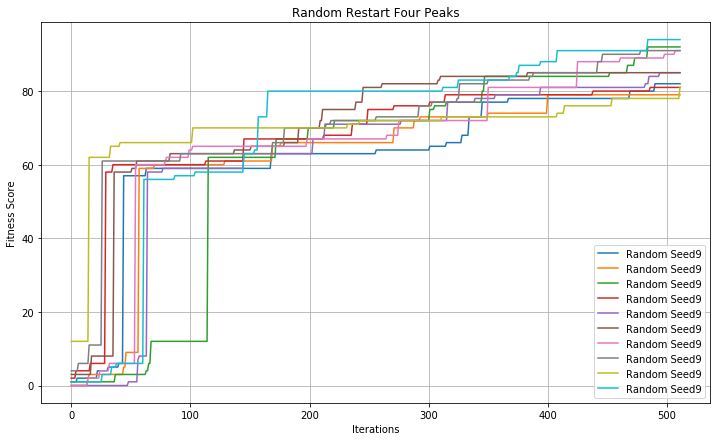

In [95]:
i=0
plt.figure(figsize=(12, 7))
plt.title('Random Restart Four Peaks')
plt.xlabel('Iterations')
plt.ylabel('Fitness Score')
plt.grid()
for data in fin_data:
    plt.plot(data, label=label)
    i += 1
plt.legend(loc='best')

print("Average Fitness Value: ", sum(fitness_values)/len(fitness_values))
print("Total Time Taken: ", total_end_time - total_start_time)

fitness_values = np.array(fitness_values)
index = np.argmax(fitness_values)
best_val = fitness_values[index]
print("Best Restart Value: ", index)
print("Best Value: ", best_val)

# For final plot
best_rhc_data = fin_data[index]

# Simulated Annealing

#### Untuned

In [99]:
schedule = mlrose.ExpDecay()
fitness_values = []

fin_data = []
i=0
total_start_time = time.time()
for seed in seeds:
    start_time = time.time()
    best_state, best_fitness, data = sa(problem, schedule=schedule, seed=seed, max_iters=1000)
    end_time = time.time()
    
    fitness_values.append(best_fitness)
    fin_data.append(data)
    
    print("=======================================\n")
    print("Seed number: ", i)
    print("Best State: ", best_state)
    print("Best Fitness: ", best_fitness)
    print("Iterations: ", len(data))
    print("Time Taken: ", end_time - start_time)
    print("\n=======================================")
    i+=1

total_end_time = time.time()

Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 4

Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Ite

Current Iteration: 609
Current Iteration: 610
Current Iteration: 611
Current Iteration: 612
Current Iteration: 613
Current Iteration: 614
Current Iteration: 615
Current Iteration: 616
Current Iteration: 617
Current Iteration: 618
Current Iteration: 619
Current Iteration: 620
Current Iteration: 621
Current Iteration: 622
Current Iteration: 623
Current Iteration: 624
Current Iteration: 625
Current Iteration: 626
Current Iteration: 627
Current Iteration: 628
Current Iteration: 629
Current Iteration: 630
Current Iteration: 631
Current Iteration: 632
Current Iteration: 633
Current Iteration: 634
Current Iteration: 635
Current Iteration: 636
Current Iteration: 637
Current Iteration: 638
Current Iteration: 639
Current Iteration: 640
Current Iteration: 641
Current Iteration: 642
Current Iteration: 643
Current Iteration: 644
Current Iteration: 645
Current Iteration: 646
Current Iteration: 647
Current Iteration: 648
Current Iteration: 649
Current Iteration: 650
Current Iteration: 651
Current Ite

Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Ite

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iterat

Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current Iteration: 71
Current Iteration: 72
Current Iteration: 73
Current Iteration: 74
Current Iteration: 75
Current Iteration: 76
Current Iteration: 77
Current Iteration: 78
Current Iteration: 79
Current Iteration: 80
Current Iteration: 81
Current It

Current Iteration: 569
Current Iteration: 570
Current Iteration: 571
Current Iteration: 572
Current Iteration: 573
Current Iteration: 574
Current Iteration: 575
Current Iteration: 576
Current Iteration: 577
Current Iteration: 578
Current Iteration: 579
Current Iteration: 580
Current Iteration: 581
Current Iteration: 582
Current Iteration: 583
Current Iteration: 584
Current Iteration: 585
Current Iteration: 586
Current Iteration: 587
Current Iteration: 588
Current Iteration: 589
Current Iteration: 590
Current Iteration: 591
Current Iteration: 592
Current Iteration: 593
Current Iteration: 594
Current Iteration: 595
Current Iteration: 596
Current Iteration: 597
Current Iteration: 598
Current Iteration: 599
Current Iteration: 600

Seed number:  4
Best State:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 0 1 0 1 0 0 0 1 0 1 0 1]
Best Fitness:  38.0
Iterations:  600
Time Taken:  0.26213574409484863

Current Iteration: 0
Current Iteration: 1
Current Iteration:

Current Iteration: 537
Current Iteration: 538
Current Iteration: 539
Current Iteration: 540
Current Iteration: 541
Current Iteration: 542
Current Iteration: 543
Current Iteration: 544
Current Iteration: 545
Current Iteration: 546
Current Iteration: 547
Current Iteration: 548
Current Iteration: 549
Current Iteration: 550
Current Iteration: 551
Current Iteration: 552
Current Iteration: 553
Current Iteration: 554
Current Iteration: 555
Current Iteration: 556
Current Iteration: 557
Current Iteration: 558
Current Iteration: 559
Current Iteration: 560
Current Iteration: 561
Current Iteration: 562
Current Iteration: 563
Current Iteration: 564
Current Iteration: 565
Current Iteration: 566
Current Iteration: 567
Current Iteration: 568
Current Iteration: 569
Current Iteration: 570
Current Iteration: 571
Current Iteration: 572
Current Iteration: 573
Current Iteration: 574
Current Iteration: 575
Current Iteration: 576
Current Iteration: 577
Current Iteration: 578
Current Iteration: 579
Current Ite

Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current Iteration: 60
Current Iteration: 61
Current Iteration: 62
Current Iteration: 63
Current Iteration: 64
Current Iteration: 65
Current Iteration: 66
Current Iteration: 67
Current Iteration: 68
Current Iteration: 69
Current Iteration: 70
Current It

Current Iteration: 547
Current Iteration: 548
Current Iteration: 549
Current Iteration: 550
Current Iteration: 551
Current Iteration: 552
Current Iteration: 553
Current Iteration: 554
Current Iteration: 555
Current Iteration: 556
Current Iteration: 557
Current Iteration: 558
Current Iteration: 559
Current Iteration: 560
Current Iteration: 561
Current Iteration: 562
Current Iteration: 563
Current Iteration: 564
Current Iteration: 565
Current Iteration: 566
Current Iteration: 567
Current Iteration: 568
Current Iteration: 569
Current Iteration: 570
Current Iteration: 571
Current Iteration: 572
Current Iteration: 573
Current Iteration: 574
Current Iteration: 575
Current Iteration: 576
Current Iteration: 577
Current Iteration: 578
Current Iteration: 579
Current Iteration: 580
Current Iteration: 581
Current Iteration: 582
Current Iteration: 583
Current Iteration: 584
Current Iteration: 585
Current Iteration: 586
Current Iteration: 587
Current Iteration: 588
Current Iteration: 589
Current Ite

Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Iteration: 207
Current Iteration: 208
Current Iteration: 209
Current Iteration: 210
Current Iteration: 211
Current Iteration: 212
Current Iteration: 213
Current Iteration: 214
Current Iteration: 215
Current Iteration: 216
Current Iteration: 217
Current Iteration: 218
Current Iteration: 219
Current Iteration: 220
Current Iteration: 221
Current Iteration: 222
Current Iteration: 223
Current Iteration: 224
Current Iteration: 225
Current Ite

Current Iteration: 800
Current Iteration: 801
Current Iteration: 802
Current Iteration: 803
Current Iteration: 804
Current Iteration: 805
Current Iteration: 806
Current Iteration: 807
Current Iteration: 808
Current Iteration: 809
Current Iteration: 810
Current Iteration: 811
Current Iteration: 812
Current Iteration: 813
Current Iteration: 814
Current Iteration: 815
Current Iteration: 816
Current Iteration: 817
Current Iteration: 818
Current Iteration: 819
Current Iteration: 820
Current Iteration: 821
Current Iteration: 822
Current Iteration: 823
Current Iteration: 824
Current Iteration: 825
Current Iteration: 826
Current Iteration: 827
Current Iteration: 828
Current Iteration: 829
Current Iteration: 830
Current Iteration: 831
Current Iteration: 832
Current Iteration: 833
Current Iteration: 834
Current Iteration: 835
Current Iteration: 836
Current Iteration: 837
Current Iteration: 838
Current Iteration: 839
Current Iteration: 840
Current Iteration: 841
Current Iteration: 842
Current Ite

Current Iteration: 566
Current Iteration: 567
Current Iteration: 568
Current Iteration: 569
Current Iteration: 570
Current Iteration: 571
Current Iteration: 572
Current Iteration: 573
Current Iteration: 574
Current Iteration: 575
Current Iteration: 576
Current Iteration: 577
Current Iteration: 578
Current Iteration: 579
Current Iteration: 580
Current Iteration: 581
Current Iteration: 582
Current Iteration: 583
Current Iteration: 584
Current Iteration: 585
Current Iteration: 586
Current Iteration: 587
Current Iteration: 588
Current Iteration: 589
Current Iteration: 590
Current Iteration: 591
Current Iteration: 592
Current Iteration: 593
Current Iteration: 594
Current Iteration: 595
Current Iteration: 596
Current Iteration: 597
Current Iteration: 598
Current Iteration: 599
Current Iteration: 600
Current Iteration: 601
Current Iteration: 602
Current Iteration: 603
Current Iteration: 604
Current Iteration: 605
Current Iteration: 606
Current Iteration: 607
Current Iteration: 608
Current Ite

Average Fitness Value:  64.2
Total Time Taken:  2.960129976272583
Best Value:  93.0


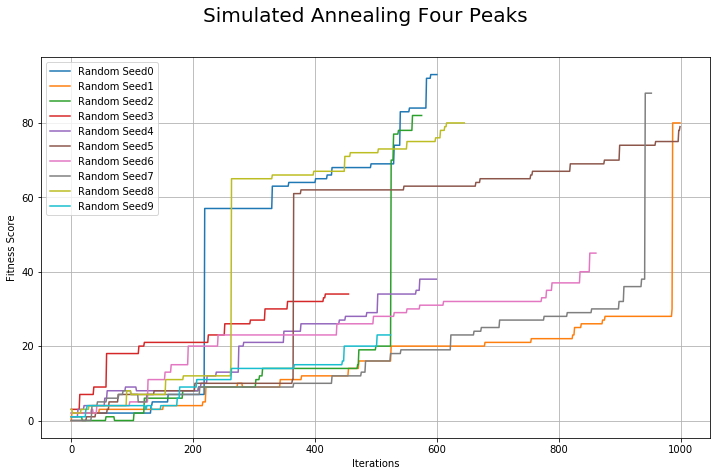

In [101]:
i=0
plt.figure(figsize=(12, 7))
plt.suptitle('Simulated Annealing Four Peaks', fontsize=20)
plt.xlabel('Iterations')
plt.ylabel('Fitness Score')
plt.grid()
for data in fin_data:
    label = "Random Seed" + str(i)
    plt.plot(data, label=label)
    i += 1
plt.legend(loc='best')

print("Average Fitness Value: ", sum(fitness_values)/len(fitness_values))
print("Total Time Taken: ", total_end_time - total_start_time)

fitness_values = np.array(fitness_values)
index = np.argmax(fitness_values)
best_val = fitness_values[index]

print("Best Value: ", best_val)

plt.savefig('SA.png')

#### Tuning Process

In [120]:
experiment_name = 'SA Tuning'
# problem = mlrose.DiscreteOpt(length=len(values), fitness_fn=fitness, maximize=True, max_val=2)

sa_run = mlrose.SARunner(problem=problem,
                    experiment_name=experiment_name,
                    iteration_list=[100000],
                    temperature_list=[1, 10, 50, 100, 250, 500, 1000, 2500, 5000],
                    decay_list=[mlrose.ExpDecay, mlrose.GeomDecay],
                    max_attempts=100,
                    seed=0)   
df_run_stats, df_run_curves = sa_run.run()

the_index = np.argmax(df_run_stats["Fitness"])
print("Best: ", df_run_stats.iloc[the_index])

best_index_in_curve = df_run_curves.Fitness.idxmax()
best_decay = df_run_curves.iloc[best_index_in_curve].Temperature
best_curve = df_run_curves.loc[df_run_curves.Temperature == best_decay, :]
best_curve.reset_index(inplace=True)
best_decay

Running sa
*****************
*** Run START ***
*****************
schedule:[1], max_iters:[100000]
runner_name:[sa], experiment_name:[SA Tuning], attempt:[0], iteration:[0], done:[False], time:[0.00], fitness:[0.0000]
	[0 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 0// 1 1 0 0 1 0 1 1 1 1 1 0 1]...

schedule:[1], max_iters:[100000]
runner_name:[sa], experiment_name:[SA Tuning], attempt:[101], iteration:[942], done:[True], time:[0.09], fitness:[93.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1// 1 1 1 1 1 1 0 0 0 0 0 0 0]...

***************
*** Run END ***
***************
*****************
*** Run START ***
*****************
schedule:[1], max_iters:[100000]
runner_name:[sa], experiment_name:[SA Tuning], attempt:[0], iteration:[0], done:[False], time:[0.00], fitness:[0.0000]
	[0 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 0// 1 1 0 0 1 0 1 1 1 1 1 0 1]...

schedule:[1], max_iters:[100000]
runner_name:[

schedule:[1000], max_iters:[100000]
runner_name:[sa], experiment_name:[SA Tuning], attempt:[101], iteration:[2129], done:[True], time:[0.25], fitness:[94.0000]
	[1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

***************
*** Run END ***
***************
*****************
*** Run START ***
*****************
schedule:[2500], max_iters:[100000]
runner_name:[sa], experiment_name:[SA Tuning], attempt:[0], iteration:[0], done:[False], time:[0.00], fitness:[0.0000]
	[0 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 0// 1 1 0 0 1 0 1 1 1 1 1 0 1]...

schedule:[2500], max_iters:[100000]
runner_name:[sa], experiment_name:[SA Tuning], attempt:[101], iteration:[2674], done:[True], time:[0.34], fitness:[94.0000]
	[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1// 1 1 1 1 1 1 1 0 0 0 0 0 0]...

***************
*** Run END ***
***************
*****************
*** Run START ***
************

ExpDecay(init_temp=50, exp_const=0.005, min_temp=0.001)

#### SA Tuned

In [121]:
seeds = np.random.randint(1, 50, 10)
fitness_values = []
fin_data = []
i = 0

total_start_time = time.time()
for seed in seeds:
    print("=======================================\n")
    print("Seed number: ", i)
    start_time = time.time()
    best_state, best_fitness, data = sa(problem,schedule=mlrose.ExpDecay(init_temp=50, exp_const=0.005,
                                                                                min_temp=0.001),
                                                seed=seed, max_iters=100000)
    end_time = time.time()
    
    fitness_values.append(best_fitness)
    fin_data.append(data)
    
    print("Best State: ", best_state)
    print("Best Fitness: ", best_fitness)
    print("Iterations: ", len(data))
    print("Time Taken: ", end_time - start_time)
    print("\n=======================================")
    i+=1

total_end_time = time.time()


Seed number:  0
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Cur

Current Iteration: 1049
Current Iteration: 1050
Current Iteration: 1051
Current Iteration: 1052
Current Iteration: 1053
Current Iteration: 1054
Current Iteration: 1055
Current Iteration: 1056
Current Iteration: 1057
Current Iteration: 1058
Current Iteration: 1059
Current Iteration: 1060
Current Iteration: 1061
Current Iteration: 1062
Current Iteration: 1063
Current Iteration: 1064
Current Iteration: 1065
Current Iteration: 1066
Current Iteration: 1067
Current Iteration: 1068
Current Iteration: 1069
Current Iteration: 1070
Current Iteration: 1071
Current Iteration: 1072
Current Iteration: 1073
Current Iteration: 1074
Current Iteration: 1075
Current Iteration: 1076
Current Iteration: 1077
Current Iteration: 1078
Current Iteration: 1079
Current Iteration: 1080
Current Iteration: 1081
Current Iteration: 1082
Current Iteration: 1083
Current Iteration: 1084
Current Iteration: 1085
Current Iteration: 1086
Current Iteration: 1087
Current Iteration: 1088
Current Iteration: 1089
Current Iteratio

Current Iteration: 634
Current Iteration: 635
Current Iteration: 636
Current Iteration: 637
Current Iteration: 638
Current Iteration: 639
Current Iteration: 640
Current Iteration: 641
Current Iteration: 642
Current Iteration: 643
Current Iteration: 644
Current Iteration: 645
Current Iteration: 646
Current Iteration: 647
Current Iteration: 648
Current Iteration: 649
Current Iteration: 650
Current Iteration: 651
Current Iteration: 652
Current Iteration: 653
Current Iteration: 654
Current Iteration: 655
Current Iteration: 656
Current Iteration: 657
Current Iteration: 658
Current Iteration: 659
Current Iteration: 660
Current Iteration: 661
Current Iteration: 662
Current Iteration: 663
Current Iteration: 664
Current Iteration: 665
Current Iteration: 666
Current Iteration: 667
Current Iteration: 668
Current Iteration: 669
Current Iteration: 670
Current Iteration: 671
Current Iteration: 672
Current Iteration: 673
Current Iteration: 674
Current Iteration: 675
Current Iteration: 676
Current Ite

Current Iteration: 1390
Current Iteration: 1391
Current Iteration: 1392
Current Iteration: 1393
Current Iteration: 1394
Current Iteration: 1395
Current Iteration: 1396
Current Iteration: 1397
Current Iteration: 1398
Current Iteration: 1399
Current Iteration: 1400
Current Iteration: 1401
Current Iteration: 1402
Current Iteration: 1403
Current Iteration: 1404
Current Iteration: 1405
Current Iteration: 1406
Current Iteration: 1407
Current Iteration: 1408
Current Iteration: 1409
Current Iteration: 1410
Current Iteration: 1411
Current Iteration: 1412
Current Iteration: 1413
Current Iteration: 1414
Current Iteration: 1415
Current Iteration: 1416
Current Iteration: 1417
Current Iteration: 1418
Current Iteration: 1419
Current Iteration: 1420
Current Iteration: 1421
Current Iteration: 1422
Current Iteration: 1423
Current Iteration: 1424
Current Iteration: 1425
Current Iteration: 1426
Current Iteration: 1427
Current Iteration: 1428
Current Iteration: 1429
Current Iteration: 1430
Current Iteratio

Current Iteration: 604
Current Iteration: 605
Current Iteration: 606
Current Iteration: 607
Current Iteration: 608
Current Iteration: 609
Current Iteration: 610
Current Iteration: 611
Current Iteration: 612
Current Iteration: 613
Current Iteration: 614
Current Iteration: 615
Current Iteration: 616
Current Iteration: 617
Current Iteration: 618
Current Iteration: 619
Current Iteration: 620
Current Iteration: 621
Current Iteration: 622
Current Iteration: 623
Current Iteration: 624
Current Iteration: 625
Current Iteration: 626
Current Iteration: 627
Current Iteration: 628
Current Iteration: 629
Current Iteration: 630
Current Iteration: 631
Current Iteration: 632
Current Iteration: 633
Current Iteration: 634
Current Iteration: 635
Current Iteration: 636
Current Iteration: 637
Current Iteration: 638
Current Iteration: 639
Current Iteration: 640
Current Iteration: 641
Current Iteration: 642
Current Iteration: 643
Current Iteration: 644
Current Iteration: 645
Current Iteration: 646
Current Ite

Current Iteration: 1245
Current Iteration: 1246
Current Iteration: 1247
Current Iteration: 1248
Current Iteration: 1249
Current Iteration: 1250
Current Iteration: 1251
Current Iteration: 1252
Current Iteration: 1253
Current Iteration: 1254
Current Iteration: 1255
Current Iteration: 1256
Current Iteration: 1257
Current Iteration: 1258
Current Iteration: 1259
Current Iteration: 1260
Current Iteration: 1261
Current Iteration: 1262
Current Iteration: 1263
Current Iteration: 1264
Current Iteration: 1265
Best State:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 0 1 0
 0 0 1 0 0 1 1 0 0 0 0 0 0]
Best Fitness:  80.0
Iterations:  1265
Time Taken:  0.41956615447998047


Seed number:  3
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iterati

Current Iteration: 819
Current Iteration: 820
Current Iteration: 821
Current Iteration: 822
Current Iteration: 823
Current Iteration: 824
Current Iteration: 825
Current Iteration: 826
Current Iteration: 827
Current Iteration: 828
Current Iteration: 829
Current Iteration: 830
Current Iteration: 831
Current Iteration: 832
Current Iteration: 833
Current Iteration: 834
Current Iteration: 835
Current Iteration: 836
Current Iteration: 837
Current Iteration: 838
Current Iteration: 839
Current Iteration: 840
Current Iteration: 841
Current Iteration: 842
Current Iteration: 843
Current Iteration: 844
Current Iteration: 845
Current Iteration: 846
Current Iteration: 847
Current Iteration: 848
Current Iteration: 849
Current Iteration: 850
Current Iteration: 851
Current Iteration: 852
Current Iteration: 853
Current Iteration: 854
Current Iteration: 855
Current Iteration: 856
Current Iteration: 857
Current Iteration: 858
Current Iteration: 859
Current Iteration: 860
Current Iteration: 861
Current Ite

Current Iteration: 1378
Current Iteration: 1379
Current Iteration: 1380
Current Iteration: 1381
Current Iteration: 1382
Current Iteration: 1383
Current Iteration: 1384
Current Iteration: 1385
Current Iteration: 1386
Current Iteration: 1387
Current Iteration: 1388
Current Iteration: 1389
Current Iteration: 1390
Current Iteration: 1391
Current Iteration: 1392
Current Iteration: 1393
Current Iteration: 1394
Current Iteration: 1395
Current Iteration: 1396
Current Iteration: 1397
Current Iteration: 1398
Current Iteration: 1399
Current Iteration: 1400
Current Iteration: 1401
Current Iteration: 1402
Current Iteration: 1403
Current Iteration: 1404
Current Iteration: 1405
Current Iteration: 1406
Current Iteration: 1407
Current Iteration: 1408
Current Iteration: 1409
Current Iteration: 1410
Current Iteration: 1411
Current Iteration: 1412
Current Iteration: 1413
Current Iteration: 1414
Current Iteration: 1415
Current Iteration: 1416
Current Iteration: 1417
Current Iteration: 1418
Current Iteratio

Current Iteration: 558
Current Iteration: 559
Current Iteration: 560
Current Iteration: 561
Current Iteration: 562
Current Iteration: 563
Current Iteration: 564
Current Iteration: 565
Current Iteration: 566
Current Iteration: 567
Current Iteration: 568
Current Iteration: 569
Current Iteration: 570
Current Iteration: 571
Current Iteration: 572
Current Iteration: 573
Current Iteration: 574
Current Iteration: 575
Current Iteration: 576
Current Iteration: 577
Current Iteration: 578
Current Iteration: 579
Current Iteration: 580
Current Iteration: 581
Current Iteration: 582
Current Iteration: 583
Current Iteration: 584
Current Iteration: 585
Current Iteration: 586
Current Iteration: 587
Current Iteration: 588
Current Iteration: 589
Current Iteration: 590
Current Iteration: 591
Current Iteration: 592
Current Iteration: 593
Current Iteration: 594
Current Iteration: 595
Current Iteration: 596
Current Iteration: 597
Current Iteration: 598
Current Iteration: 599
Current Iteration: 600
Current Ite

Current Iteration: 1133
Current Iteration: 1134
Current Iteration: 1135
Current Iteration: 1136
Current Iteration: 1137
Current Iteration: 1138
Current Iteration: 1139
Current Iteration: 1140
Current Iteration: 1141
Current Iteration: 1142
Current Iteration: 1143
Current Iteration: 1144
Current Iteration: 1145
Current Iteration: 1146
Current Iteration: 1147
Current Iteration: 1148
Current Iteration: 1149
Current Iteration: 1150
Current Iteration: 1151
Current Iteration: 1152
Current Iteration: 1153
Current Iteration: 1154
Current Iteration: 1155
Current Iteration: 1156
Current Iteration: 1157
Current Iteration: 1158
Current Iteration: 1159
Current Iteration: 1160
Current Iteration: 1161
Current Iteration: 1162
Current Iteration: 1163
Current Iteration: 1164
Current Iteration: 1165
Current Iteration: 1166
Current Iteration: 1167
Current Iteration: 1168
Current Iteration: 1169
Current Iteration: 1170
Current Iteration: 1171
Current Iteration: 1172
Current Iteration: 1173
Current Iteratio

Current Iteration: 410
Current Iteration: 411
Current Iteration: 412
Current Iteration: 413
Current Iteration: 414
Current Iteration: 415
Current Iteration: 416
Current Iteration: 417
Current Iteration: 418
Current Iteration: 419
Current Iteration: 420
Current Iteration: 421
Current Iteration: 422
Current Iteration: 423
Current Iteration: 424
Current Iteration: 425
Current Iteration: 426
Current Iteration: 427
Current Iteration: 428
Current Iteration: 429
Current Iteration: 430
Current Iteration: 431
Current Iteration: 432
Current Iteration: 433
Current Iteration: 434
Current Iteration: 435
Current Iteration: 436
Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Ite

Current Iteration: 1028
Current Iteration: 1029
Current Iteration: 1030
Current Iteration: 1031
Current Iteration: 1032
Current Iteration: 1033
Current Iteration: 1034
Current Iteration: 1035
Current Iteration: 1036
Current Iteration: 1037
Current Iteration: 1038
Current Iteration: 1039
Current Iteration: 1040
Current Iteration: 1041
Current Iteration: 1042
Current Iteration: 1043
Current Iteration: 1044
Current Iteration: 1045
Current Iteration: 1046
Current Iteration: 1047
Current Iteration: 1048
Current Iteration: 1049
Current Iteration: 1050
Current Iteration: 1051
Current Iteration: 1052
Current Iteration: 1053
Current Iteration: 1054
Current Iteration: 1055
Current Iteration: 1056
Current Iteration: 1057
Current Iteration: 1058
Current Iteration: 1059
Best State:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 0 1 1 1 1 1 0 1 1 0 0]
Best Fitness:  39.0
Iterations:  1059
Time Taken:  0.329272985458374


Seed number:  6
Current Iteration: 0
Current 

Current Iteration: 665
Current Iteration: 666
Current Iteration: 667
Current Iteration: 668
Current Iteration: 669
Current Iteration: 670
Current Iteration: 671
Current Iteration: 672
Current Iteration: 673
Current Iteration: 674
Current Iteration: 675
Current Iteration: 676
Current Iteration: 677
Current Iteration: 678
Current Iteration: 679
Current Iteration: 680
Current Iteration: 681
Current Iteration: 682
Current Iteration: 683
Current Iteration: 684
Current Iteration: 685
Current Iteration: 686
Current Iteration: 687
Current Iteration: 688
Current Iteration: 689
Current Iteration: 690
Current Iteration: 691
Current Iteration: 692
Current Iteration: 693
Current Iteration: 694
Current Iteration: 695
Current Iteration: 696
Current Iteration: 697
Current Iteration: 698
Current Iteration: 699
Current Iteration: 700
Current Iteration: 701
Current Iteration: 702
Current Iteration: 703
Current Iteration: 704
Current Iteration: 705
Current Iteration: 706
Current Iteration: 707
Current Ite

Current Iteration: 437
Current Iteration: 438
Current Iteration: 439
Current Iteration: 440
Current Iteration: 441
Current Iteration: 442
Current Iteration: 443
Current Iteration: 444
Current Iteration: 445
Current Iteration: 446
Current Iteration: 447
Current Iteration: 448
Current Iteration: 449
Current Iteration: 450
Current Iteration: 451
Current Iteration: 452
Current Iteration: 453
Current Iteration: 454
Current Iteration: 455
Current Iteration: 456
Current Iteration: 457
Current Iteration: 458
Current Iteration: 459
Current Iteration: 460
Current Iteration: 461
Current Iteration: 462
Current Iteration: 463
Current Iteration: 464
Current Iteration: 465
Current Iteration: 466
Current Iteration: 467
Current Iteration: 468
Current Iteration: 469
Current Iteration: 470
Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Ite

Current Iteration: 1330
Current Iteration: 1331
Current Iteration: 1332
Current Iteration: 1333
Current Iteration: 1334
Current Iteration: 1335
Current Iteration: 1336
Current Iteration: 1337
Current Iteration: 1338
Current Iteration: 1339
Current Iteration: 1340
Current Iteration: 1341
Current Iteration: 1342
Current Iteration: 1343
Current Iteration: 1344
Current Iteration: 1345
Current Iteration: 1346
Current Iteration: 1347
Current Iteration: 1348
Current Iteration: 1349
Current Iteration: 1350
Current Iteration: 1351
Current Iteration: 1352
Current Iteration: 1353
Current Iteration: 1354
Current Iteration: 1355
Current Iteration: 1356
Current Iteration: 1357
Current Iteration: 1358
Current Iteration: 1359
Current Iteration: 1360
Current Iteration: 1361
Current Iteration: 1362
Current Iteration: 1363
Current Iteration: 1364
Current Iteration: 1365
Current Iteration: 1366
Current Iteration: 1367
Current Iteration: 1368
Current Iteration: 1369
Current Iteration: 1370
Current Iteratio

Current Iteration: 164
Current Iteration: 165
Current Iteration: 166
Current Iteration: 167
Current Iteration: 168
Current Iteration: 169
Current Iteration: 170
Current Iteration: 171
Current Iteration: 172
Current Iteration: 173
Current Iteration: 174
Current Iteration: 175
Current Iteration: 176
Current Iteration: 177
Current Iteration: 178
Current Iteration: 179
Current Iteration: 180
Current Iteration: 181
Current Iteration: 182
Current Iteration: 183
Current Iteration: 184
Current Iteration: 185
Current Iteration: 186
Current Iteration: 187
Current Iteration: 188
Current Iteration: 189
Current Iteration: 190
Current Iteration: 191
Current Iteration: 192
Current Iteration: 193
Current Iteration: 194
Current Iteration: 195
Current Iteration: 196
Current Iteration: 197
Current Iteration: 198
Current Iteration: 199
Current Iteration: 200
Current Iteration: 201
Current Iteration: 202
Current Iteration: 203
Current Iteration: 204
Current Iteration: 205
Current Iteration: 206
Current Ite

Current Iteration: 1070
Current Iteration: 1071
Current Iteration: 1072
Current Iteration: 1073
Current Iteration: 1074
Current Iteration: 1075
Current Iteration: 1076
Current Iteration: 1077
Current Iteration: 1078
Current Iteration: 1079
Current Iteration: 1080
Current Iteration: 1081
Current Iteration: 1082
Current Iteration: 1083
Current Iteration: 1084
Current Iteration: 1085
Current Iteration: 1086
Current Iteration: 1087
Current Iteration: 1088
Current Iteration: 1089
Current Iteration: 1090
Current Iteration: 1091
Current Iteration: 1092
Current Iteration: 1093
Current Iteration: 1094
Current Iteration: 1095
Current Iteration: 1096
Current Iteration: 1097
Current Iteration: 1098
Current Iteration: 1099
Current Iteration: 1100
Current Iteration: 1101
Current Iteration: 1102
Current Iteration: 1103
Current Iteration: 1104
Current Iteration: 1105
Current Iteration: 1106
Current Iteration: 1107
Current Iteration: 1108
Current Iteration: 1109
Current Iteration: 1110
Current Iteratio

Current Iteration: 471
Current Iteration: 472
Current Iteration: 473
Current Iteration: 474
Current Iteration: 475
Current Iteration: 476
Current Iteration: 477
Current Iteration: 478
Current Iteration: 479
Current Iteration: 480
Current Iteration: 481
Current Iteration: 482
Current Iteration: 483
Current Iteration: 484
Current Iteration: 485
Current Iteration: 486
Current Iteration: 487
Current Iteration: 488
Current Iteration: 489
Current Iteration: 490
Current Iteration: 491
Current Iteration: 492
Current Iteration: 493
Current Iteration: 494
Current Iteration: 495
Current Iteration: 496
Current Iteration: 497
Current Iteration: 498
Current Iteration: 499
Current Iteration: 500
Current Iteration: 501
Current Iteration: 502
Current Iteration: 503
Current Iteration: 504
Current Iteration: 505
Current Iteration: 506
Current Iteration: 507
Current Iteration: 508
Current Iteration: 509
Current Iteration: 510
Current Iteration: 511
Current Iteration: 512
Current Iteration: 513
Current Ite

Average Fitness Value:  75.9
Total Time Taken:  3.818798065185547
Best Restart Value:  7
Best Value:  87.0


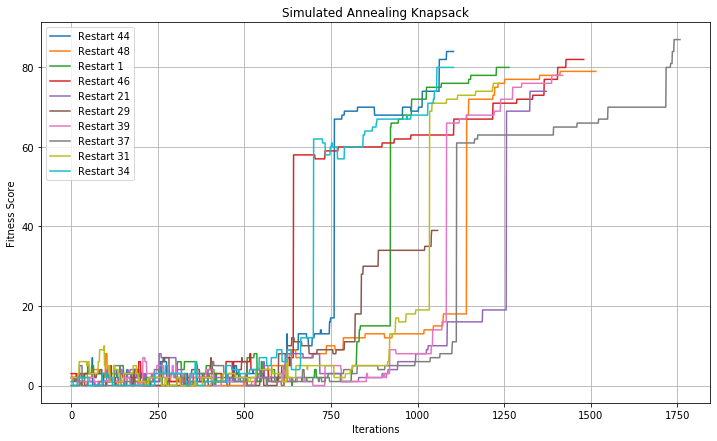

In [122]:
i=0
plt.figure(figsize=(12, 7))
plt.title('Simulated Annealing Knapsack')
plt.xlabel('Iterations')
plt.ylabel('Fitness Score')
plt.grid()
for data in fin_data:
    label = "Restart " + str(seeds[i])
    plt.plot(data, label=label)
    i += 1
plt.legend(loc='best')

print("Average Fitness Value: ", sum(fitness_values)/len(fitness_values))
print("Total Time Taken: ", total_end_time - total_start_time)

fitness_values = np.array(fitness_values)
index = np.argmax(fitness_values)
best_val = fitness_values[index]
print("Best Restart Value: ", index)
print("Best Value: ", best_val)

# For final plot
best_sa_data = fin_data[index]

# Genetic Algorithm

In [123]:
fitness_values = []

fin_data = []
i=0
total_start_time = time.time()
for seed in seeds:
    start_time = time.time()
    best_state, best_fitness, data = ga(problem, seed=seed, pop_size=200, mutation=0.1, max_iters=1000)
    end_time = time.time()
    
    fitness_values.append(best_fitness)
    fin_data.append(data)
    
    print("=======================================\n")
    print("Seed number: ", i)
    print("Best State: ", best_state)
    print("Best Fitness: ", best_fitness)
    print("Iterations: ", len(data))
    print("Time Taken: ", end_time - start_time)
    print("\n=======================================")
    i+=1

total_end_time = time.time()

Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27

Seed number:  0
Best State:  [1 1 1 1 1 1 0 1 0 1 1 1 1 1 0 0 0 0 0 1 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
Best Fitness:  70.0
Iterations:  27
Time Taken:  0.6922299861907959

Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Cur

Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iteration: 51
Current Iteration: 52
Current Iteration: 53
Current Iteration: 54
Current Iteration: 55
Current Iteration: 56
Current Iteration: 57
Current Iteration: 58
Current Iteration: 59
Current It

Average Fitness Value:  80.9
Total Time Taken:  12.0150728225708
Best Value:  94.0


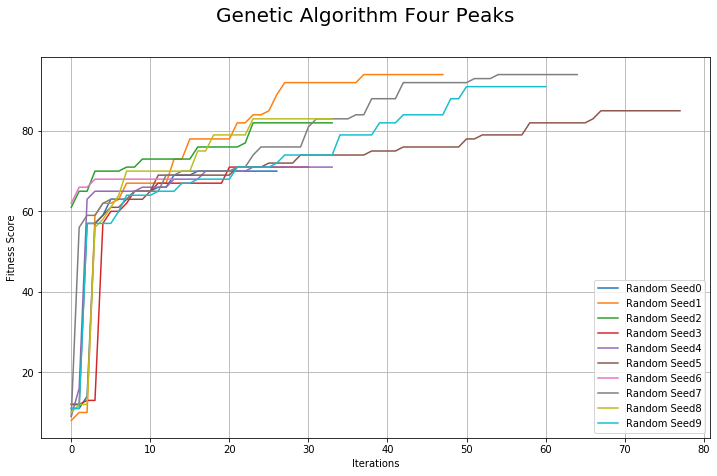

In [124]:
i=0
plt.figure(figsize=(12, 7))
plt.suptitle('Genetic Algorithm Four Peaks', fontsize=20)
plt.xlabel('Iterations')
plt.ylabel('Fitness Score')
plt.grid()
for data in fin_data:
    label = "Random Seed" + str(i)
    plt.plot(data, label=label)
    i += 1
plt.legend(loc='best')

print("Average Fitness Value: ", sum(fitness_values)/len(fitness_values))
print("Total Time Taken: ", total_end_time - total_start_time)

fitness_values = np.array(fitness_values)
index = np.argmax(fitness_values)
best_val = fitness_values[index]

print("Best Value: ", best_val)

plt.savefig('GA.png')

#### Tuning Process

In [125]:
g_a = mlrose.GARunner(problem=problem,
                          experiment_name="GA_Exp",
                          seed=0,
                          iteration_list=[100000],
                          max_attempts=100,
                          population_sizes=[50, 200, 500],
                          mutation_rates=[0.1, 0.25, 0.5])
ga_run_stats, ga_run_curves = g_a.run()

the_index = np.argmax(ga_run_stats["Fitness"])
ga_run_stats.iloc[the_index]

Running ga
*****************
*** Run START ***
*****************
pop_size:[50], mutation_prob:[0.1], max_iters:[100000]
runner_name:[ga], experiment_name:[GA_Exp], attempt:[0], iteration:[0], done:[False], time:[0.00], fitness:[0.0000]
	[0 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 0// 1 1 0 0 1 0 1 1 1 1 1 0 1]...

pop_size:[50], mutation_prob:[0.1], max_iters:[100000]
runner_name:[ga], experiment_name:[GA_Exp], attempt:[101], iteration:[628], done:[True], time:[3.57], fitness:[84.0000]
	[1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0// 0 0 0 0 0 0 0 0 0 0 0 0 0]...

***************
*** Run END ***
***************
*****************
*** Run START ***
*****************
pop_size:[50], mutation_prob:[0.25], max_iters:[100000]
runner_name:[ga], experiment_name:[GA_Exp], attempt:[0], iteration:[0], done:[False], time:[0.00], fitness:[0.0000]
	[0 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 0// 1 1 0 0 1 0 1 1 1 1

Iteration                                                     100000
Fitness                                                           94
Time                                                        0.950313
State              [1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
Population Size                                                   50
Mutation Rate                                                   0.25
max_iters                                                     100000
Name: 3, dtype: object

# Tuned

In [126]:
fitness_values = []

fin_data = []
i=0
total_start_time = time.time()
for seed in seeds:
    start_time = time.time()
    best_state, best_fitness, data = mimic(problem, seed=seed, max_iters=1000, pop_size=200, keep_pct=0.2)
    end_time = time.time()
    
    fitness_values.append(best_fitness)
    fin_data.append(data)
    
    print("=======================================\n")
    print("Seed number: ", i)
    print("Best State: ", best_state)
    print("Best Fitness: ", best_fitness)
    print("Iterations: ", len(data))
    print("Time Taken: ", end_time - start_time)
    print("\n=======================================")
    i+=1

total_end_time = time.time()

Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29

Seed number:  0
Best State:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 0 0 1 0 1 1
 1 1 1 0 0 1 0 0 0 0 0 0 0]
Best Fitness:  74.0
Iterations:  29
Time Taken:  47.10373401641846

Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Cu

Average Fitness Value:  70.9
Total Time Taken:  333.2282078266144
Best Restart Value:  5
Best Value:  80.0


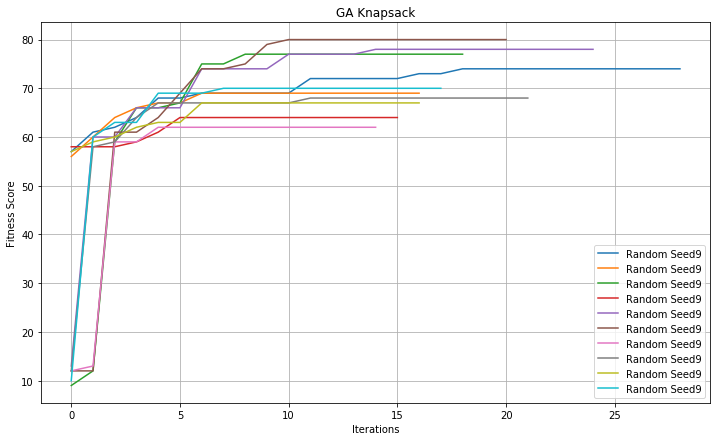

In [128]:
i=0
plt.figure(figsize=(12, 7))
plt.title('GA Knapsack')
plt.xlabel('Iterations')
plt.ylabel('Fitness Score')
plt.grid()
for data in fin_data:
    # label = "Restart " + str(restarts[i])
    plt.plot(data, label=label)
    i += 1
plt.legend(loc='best')

print("Average Fitness Value: ", sum(fitness_values)/len(fitness_values))
print("Total Time Taken: ", total_end_time - total_start_time)

fitness_values = np.array(fitness_values)
index = np.argmax(fitness_values)
best_val = fitness_values[index]
print("Best Restart Value: ", index)
print("Best Value: ", best_val)

# For final plot
best_ga_data = fin_data[index]

# MIMIC

In [51]:
fitness_values = []

fin_data = []
i=0
total_start_time = time.time()
for seed in seeds:
    start_time = time.time()
    best_state, best_fitness, data = mimic(problem, seed=seed, max_iters=1000, pop_size=200, keep_pct=0.2)
    end_time = time.time()
    
    fitness_values.append(best_fitness)
    fin_data.append(data)
    
    print("=======================================\n")
    print("Seed number: ", i)
    print("Best State: ", best_state)
    print("Best Fitness: ", best_fitness)
    print("Iterations: ", len(data))
    print("Time Taken: ", end_time - start_time)
    print("\n=======================================")
    i+=1

total_end_time = time.time()

Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17

Seed number:  0
Best State:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 1 0 1 0 1 0 1 1 1 0 1 1 0
 1 1 0 1 0 0 0 0 0 0 0 0 0]
Best Fitness:  68.0
Iterations:  17
Time Taken:  35.02810764312744

Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16

Seed number:  1
Best State:  [1 1 1 1 1 1 1 0 0 

Average Fitness Value:  70.2
Total Time Taken:  401.4611539840698
Best Value:  74.0


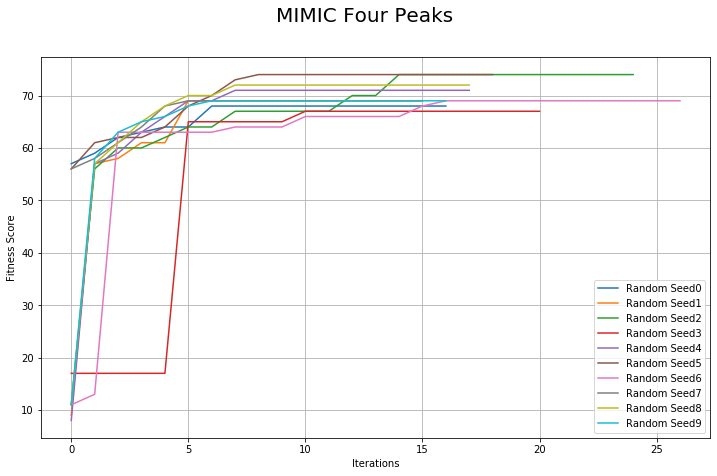

In [52]:
i=0
plt.figure(figsize=(12, 7))
plt.suptitle('MIMIC Four Peaks', fontsize=20)
plt.xlabel('Iterations')
plt.ylabel('Fitness Score')
plt.grid()
for data in fin_data:
    label = "Random Seed" + str(i)
    plt.plot(data, label=label)
    i += 1
plt.legend(loc='best')

print("Average Fitness Value: ", sum(fitness_values)/len(fitness_values))
print("Total Time Taken: ", total_end_time - total_start_time)

fitness_values = np.array(fitness_values)
index = np.argmax(fitness_values)
best_val = fitness_values[index]

print("Best Value: ", best_val)

plt.savefig('MIMIC.png')

# Combining into 1 Plot

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(data_rrhc, label='RRHC')
plt.plot(data_sa, label='SA')
plt.plot(data_ga, label='GA')
plt.plot(data_mimic, label='MIMIC')
plt.title('Fitness Function Curves')
plt.xlabel('# Iterations')
plt.ylabel('Fitness Score')
plt.legend(loc='best')
plt.grid()

In [65]:
t = np.linspace(0.01, 0.8, 50)
i = 0

rrhc_fitness = []
sa_fitness = []
ga_fitness = []
mimic_fitness = []

for pct in t:
    
    fitness = mlrose.FourPeaks(t_pct=pct)
    problem = mlrose.DiscreteOpt(length=25, fitness_fn=fitness, maximize=True, max_val=2)
    
    print("================================================ \n\n\n\n")
    print("Iteration: " + str(i))
    print("Percentage: ", pct)
    
    best_state, best_fitness, _ = rrhc(problem, seed=seed, restarts=0, max_iters=1000)
    rrhc_fitness.append(best_fitness)
    best_state, best_fitness, _ = sa(problem, schedule=schedule, seed=seed, max_iters=1000)
    sa_fitness.append(best_fitness)
    best_state, best_fitness, _ = ga(problem, seed=seed, pop_size=200, mutation=0.1, max_iters=1000)
    ga_fitness.append(best_fitness)
    best_state, best_fitness, _ = mimic(problem, seed=seed, max_iters=1000, pop_size=200, keep_pct=0.2)
    mimic_fitness.append(best_fitness)
    
    i += 1





Iteration: 0
Percentage:  0.01
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 49
Current Iteration: 50
Current Iterat

Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15




Iteration: 4
Percentage:  0.07448979591836734
Current Iteration: 0
Current Iteration: 1
Cu

Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17




Iteration: 5
Percentage:  0.09061224489795917
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Ite

Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17




Iteration: 7
Percentage:  0.12285714285714285
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Cu

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Cu

Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22




Iteration: 11
Percentage:  0.1873469387755102
Current Iteration: 0
Current Iteration: 1
Current Iteration: 

Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
C

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14




Iteration: 15
Percentage:  0.2518367346938775
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 0
Current

Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17




Iteration: 16
Percentage:  0.2679591836734694
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Cu

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19




Iteration: 18
Percentage:  0.30020408163265305
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Cur

Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17




Iteration: 20
Percentage:  0.3324489795918367
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current

Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16




Iteration: 22
Percentage:  0.3646938775510204
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Curr

Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19




Iteration: 23
Percentage:  0.38081632653061226
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current It

Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18




Iteration: 25
Percentage:  0.4130612244897959
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Curr

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18




Iteration: 27
Percentage:  0.4453061224489796
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Curr

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7


Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15




Iteration: 30
Percen

Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12




Iteration: 31
Percentage:  0.509795918367347
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current 

Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Curr

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17




Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
C

Current Iteration: 35
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15




Iteration: 36
Percentage:  0.5904081632653061
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iter

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Cu

Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Curre

Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18




Iteration: 41
Percentage:  0.6710204081632652
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2


Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12




Iteration: 42
Percentage:  0.687142857142857
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Curr

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13




Iteration: 43
Percen

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13




Iteration: 45
Percentage:  0.7355102040816326
Current Iteration: 0
Current Iteration: 

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Cu

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14




Iteration: 47
Percentage:  0.7677551020408163
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3


Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 36
Current Iteration: 37
Current Iteration: 38
Current Iteration: 39
Current Iteration: 40
Current Iteration: 41
Current Iteration: 42
Current Iteration: 43
Current Iteration: 44
Current Iteration: 45
Current Iteration: 46
Current Iteration: 47
Current Iteration: 48
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteratio

Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Current Iteration: 16
Current Iteration: 17
Current Iteration: 18
Current Iteration: 19
Current Iteration: 20
Current Iteration: 21
Current Iteration: 22
Current Iteration: 23
Current Iteration: 24
Current Iteration: 25
Current Iteration: 26
Current Iteration: 27
Current Iteration: 28
Current Iteration: 29
Current Iteration: 30
Current Iteration: 31
Current Iteration: 32
Current Iteration: 33
Current Iteration: 34
Current Iteration: 35
Current Iteration: 0
Current Iteration: 1
Current Iteration: 2
Current Iteration: 3
Current Iteration: 4
Current Iteration: 5
Current Iteration: 6
Current Iteration: 7
Current Iteration: 8
Current Iteration: 9
Current Iteration: 10
Current Iteration: 11
Current Iteration: 12
Current Iteration: 13
Current Iteration: 14
Current Iteration: 15
Cu

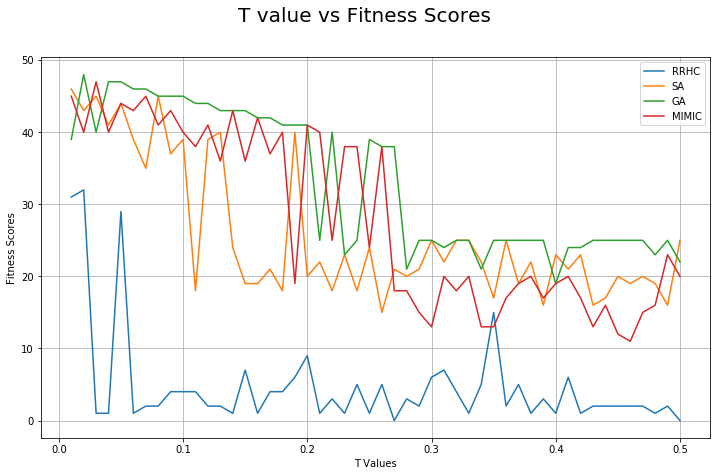

In [69]:
plt.figure(figsize=(12, 7))
plt.suptitle('T value vs Fitness Scores', fontsize=20)
plt.ylabel('Fitness Scores')
plt.xlabel('T Values')
plt.grid()
plt.plot(np.linspace(0.01, 0.5, 50), rrhc_fitness, label='RRHC')
plt.plot(np.linspace(0.01, 0.5, 50), sa_fitness, label='SA')
plt.plot(np.linspace(0.01, 0.5, 50), ga_fitness, label='GA')
plt.plot(np.linspace(0.01, 0.5, 50), mimic_fitness, label='MIMIC')
plt.legend(loc='best')

plt.savefig('comparison.png')